# Continuous Style Control:
### Image morphing using Stable Diffusion

More details about this project can be found on our [Github page](https://github.com/JonathanSwinnen/continuous-style-control/).
This notebook is based on code provided by [Prompt-to-Prompt](https://github.com/google/prompt-to-prompt/tree/main) and [Semantic Guidance](https://github.com/ml-research/semantic-image-editing)

In [1]:
# Original work: Copyright 2022 Google LLC
# Modified by: Jonathan Swinnen, Patrick Eppensteiner, Yannick Biehl
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [2]:
import sys
print("User Current Version:-", sys.version)
!python --version
!pip --version
!nvidia-smi

User Current Version:- 3.10.12 (main, Jun 11 2023, 05:26:28) [GCC 11.4.0]
Python 3.10.12
pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Thu Aug 24 17:39:47 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+----

# Setup & unmodified code copied from Prompt-to-Prompt

## Pip packages

In [3]:
!pip install diffusers==0.10.0 transformers==4.25.1 ftfy opencv-python ipywidgets
!pip install ftfy opencv-python ipywidgets
#!pip install accelerate
!pip install --upgrade scipy

## Prompt-to-Prompt with Stable Diffusion

In [4]:
from typing import Optional, Union, Tuple, List, Callable, Dict
import torch
from diffusers import StableDiffusionPipeline
import torch.nn.functional as nnf
import numpy as np
import abc
import numpy as np
import math
import torch.nn.functional as F
import torchvision.transforms as T
import time

## Copied util files from Prompt-to-Prompt

ptp_utils.py

In [5]:
# Copyright 2022 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
import cv2
from typing import Optional, Union, Tuple, List, Callable, Dict
from IPython.display import display
from tqdm.notebook import tqdm


def text_under_image(image: np.ndarray, text: str, text_color: Tuple[int, int, int] = (0, 0, 0)):
    h, w, c = image.shape
    offset = int(h * .2)
    img = np.ones((h + offset, w, c), dtype=np.uint8) * 255
    font = cv2.FONT_HERSHEY_SIMPLEX
    # font = ImageFont.truetype("/usr/share/fonts/truetype/noto/NotoMono-Regular.ttf", font_size)
    img[:h] = image
    textsize = cv2.getTextSize(text, font, 1, 2)[0]
    text_x, text_y = (w - textsize[0]) // 2, h + offset - textsize[1] // 2
    cv2.putText(img, text, (text_x, text_y ), font, 1, text_color, 2)
    return img


def view_images(images, num_rows=1, offset_ratio=0.02):
    if type(images) is list:
        num_empty = len(images) % num_rows
    elif images.ndim == 4:
        num_empty = images.shape[0] % num_rows
    else:
        images = [images]
        num_empty = 0

    empty_images = np.ones(images[0].shape, dtype=np.uint8) * 255
    images = [image.astype(np.uint8) for image in images] + [empty_images] * num_empty
    num_items = len(images)

    h, w, c = images[0].shape
    offset = int(h * offset_ratio)
    num_cols = num_items // num_rows
    image_ = np.ones((h * num_rows + offset * (num_rows - 1),
                      w * num_cols + offset * (num_cols - 1), 3), dtype=np.uint8) * 255
    for i in range(num_rows):
        for j in range(num_cols):
            image_[i * (h + offset): i * (h + offset) + h:, j * (w + offset): j * (w + offset) + w] = images[
                i * num_cols + j]

    pil_img = Image.fromarray(image_)
    display(pil_img)


def diffusion_step(model, controller, latents, context, t, guidance_scale, low_resource=False):
    if low_resource:
        noise_pred_uncond = model.unet(latents, t, encoder_hidden_states=context[0])["sample"]
        noise_prediction_text = model.unet(latents, t, encoder_hidden_states=context[1])["sample"]
    else:
        latents_input = torch.cat([latents] * 2)
        noise_pred = model.unet(latents_input, t, encoder_hidden_states=context)["sample"]
        noise_pred_uncond, noise_prediction_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_prediction_text - noise_pred_uncond)
    latents = model.scheduler.step(noise_pred, t, latents)["prev_sample"]
    latents = controller.step_callback(latents)
    return latents


def latent2image(vae, latents):
    latents = 1 / 0.18215 * latents
    image = vae.decode(latents)['sample']
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).astype(np.uint8)
    return image


def init_latent(latent, model, height, width, generator, batch_size):
    if latent is None:
        latent = torch.randn(
            (1, model.unet.in_channels, height // 8, width // 8),
            generator=generator,
        )
    latents = latent.expand(batch_size,  model.unet.in_channels, height // 8, width // 8).to(model.device)
    return latent, latents


@torch.no_grad()
def text2image_ldm(
    model,
    prompt:  List[str],
    controller,
    num_inference_steps: int = 50,
    guidance_scale: Optional[float] = 7.,
    generator: Optional[torch.Generator] = None,
    latent: Optional[torch.FloatTensor] = None,
):
    register_attention_control(model, controller)
    height = width = 256
    batch_size = len(prompt)

    uncond_input = model.tokenizer([""] * batch_size, padding="max_length", max_length=77, return_tensors="pt")
    uncond_embeddings = model.bert(uncond_input.input_ids.to(model.device))[0]

    text_input = model.tokenizer(prompt, padding="max_length", max_length=77, return_tensors="pt")
    text_embeddings = model.bert(text_input.input_ids.to(model.device))[0]
    latent, latents = init_latent(latent, model, height, width, generator, batch_size)
    context = torch.cat([uncond_embeddings, text_embeddings])

    model.scheduler.set_timesteps(num_inference_steps)
    for t in tqdm(model.scheduler.timesteps):
        latents = diffusion_step(model, controller, latents, context, t, guidance_scale)

    image = latent2image(model.vqvae, latents)

    return image, latent


def register_attention_control(model, controller):
    def ca_forward(self, place_in_unet):
        to_out = self.to_out
        if type(to_out) is torch.nn.modules.container.ModuleList:
            to_out = self.to_out[0]
        else:
            to_out = self.to_out

        def forward(x, context=None, mask=None):
            batch_size, sequence_length, dim = x.shape
            h = self.heads
            q = self.to_q(x)
            is_cross = context is not None
            context = context if is_cross else x
            k = self.to_k(context)
            v = self.to_v(context)
            q = self.reshape_heads_to_batch_dim(q)
            k = self.reshape_heads_to_batch_dim(k)
            v = self.reshape_heads_to_batch_dim(v)

            sim = torch.einsum("b i d, b j d -> b i j", q, k) * self.scale

            if mask is not None:
                mask = mask.reshape(batch_size, -1)
                max_neg_value = -torch.finfo(sim.dtype).max
                mask = mask[:, None, :].repeat(h, 1, 1)
                sim.masked_fill_(~mask, max_neg_value)

            # attention, what we cannot get enough of
            attn = sim.softmax(dim=-1)
            attn = controller(attn, is_cross, place_in_unet)
            out = torch.einsum("b i j, b j d -> b i d", attn, v)
            out = self.reshape_batch_dim_to_heads(out)
            return to_out(out)

        return forward

    class DummyController:

        def __call__(self, *args):
            return args[0]

        def __init__(self):
            self.num_att_layers = 0

    if controller is None:
        controller = DummyController()

    def register_recr(net_, count, place_in_unet):
        if net_.__class__.__name__ == 'CrossAttention':
            net_.forward = ca_forward(net_, place_in_unet)
            return count + 1
        elif hasattr(net_, 'children'):
            for net__ in net_.children():
                count = register_recr(net__, count, place_in_unet)
        return count

    cross_att_count = 0
    sub_nets = model.unet.named_children()
    for net in sub_nets:
        if "down" in net[0]:
            cross_att_count += register_recr(net[1], 0, "down")
        elif "up" in net[0]:
            cross_att_count += register_recr(net[1], 0, "up")
        elif "mid" in net[0]:
            cross_att_count += register_recr(net[1], 0, "mid")

    controller.num_att_layers = cross_att_count


def get_word_inds(text: str, word_place: int, tokenizer):
    split_text = text.split(" ")
    if type(word_place) is str:
        word_place = [i for i, word in enumerate(split_text) if word_place == word]
    elif type(word_place) is int:
        word_place = [word_place]
    out = []
    if len(word_place) > 0:
        words_encode = [tokenizer.decode([item]).strip("#") for item in tokenizer.encode(text)][1:-1]
        cur_len, ptr = 0, 0

        for i in range(len(words_encode)):
            cur_len += len(words_encode[i])
            if ptr in word_place:
                out.append(i + 1)
            if cur_len >= len(split_text[ptr]):
                ptr += 1
                cur_len = 0
    return np.array(out)


def update_alpha_time_word(alpha, bounds: Union[float, Tuple[float, float]], prompt_ind: int,
                           word_inds: Optional[torch.Tensor]=None):
    if type(bounds) is float:
        bounds = 0, bounds
    start, end = int(bounds[0] * alpha.shape[0]), int(bounds[1] * alpha.shape[0])
    if word_inds is None:
        word_inds = torch.arange(alpha.shape[2])
    alpha[: start, prompt_ind, word_inds] = 0
    alpha[start: end, prompt_ind, word_inds] = 1
    alpha[end:, prompt_ind, word_inds] = 0
    return alpha


def get_time_words_attention_alpha(prompts, num_steps,
                                   cross_replace_steps: Union[float, Dict[str, Tuple[float, float]]],
                                   tokenizer, max_num_words=77):
    if type(cross_replace_steps) is not dict:
        cross_replace_steps = {"default_": cross_replace_steps}
    if "default_" not in cross_replace_steps:
        cross_replace_steps["default_"] = (0., 1.)
    alpha_time_words = torch.zeros(num_steps + 1, len(prompts) - 1, max_num_words)
    for i in range(len(prompts) - 1):
        alpha_time_words = update_alpha_time_word(alpha_time_words, cross_replace_steps["default_"],
                                                  i)
    for key, item in cross_replace_steps.items():
        if key != "default_":
             inds = [get_word_inds(prompts[i], key, tokenizer) for i in range(1, len(prompts))]
             for i, ind in enumerate(inds):
                 if len(ind) > 0:
                    alpha_time_words = update_alpha_time_word(alpha_time_words, item, i, ind)
    alpha_time_words = alpha_time_words.reshape(num_steps + 1, len(prompts) - 1, 1, 1, max_num_words)
    return alpha_time_words


SeqAligner.py

In [6]:
# Copyright 2022 Google LLC
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
import torch
import numpy as np


class ScoreParams:

    def __init__(self, gap, match, mismatch):
        self.gap = gap
        self.match = match
        self.mismatch = mismatch

    def mis_match_char(self, x, y):
        if x != y:
            return self.mismatch
        else:
            return self.match


def get_matrix(size_x, size_y, gap):
    matrix = []
    for i in range(len(size_x) + 1):
        sub_matrix = []
        for j in range(len(size_y) + 1):
            sub_matrix.append(0)
        matrix.append(sub_matrix)
    for j in range(1, len(size_y) + 1):
        matrix[0][j] = j*gap
    for i in range(1, len(size_x) + 1):
        matrix[i][0] = i*gap
    return matrix


def get_matrix(size_x, size_y, gap):
    matrix = np.zeros((size_x + 1, size_y + 1), dtype=np.int32)
    matrix[0, 1:] = (np.arange(size_y) + 1) * gap
    matrix[1:, 0] = (np.arange(size_x) + 1) * gap
    return matrix


def get_traceback_matrix(size_x, size_y):
    matrix = np.zeros((size_x + 1, size_y +1), dtype=np.int32)
    matrix[0, 1:] = 1
    matrix[1:, 0] = 2
    matrix[0, 0] = 4
    return matrix


def global_align(x, y, score):
    matrix = get_matrix(len(x), len(y), score.gap)
    trace_back = get_traceback_matrix(len(x), len(y))
    for i in range(1, len(x) + 1):
        for j in range(1, len(y) + 1):
            left = matrix[i, j - 1] + score.gap
            up = matrix[i - 1, j] + score.gap
            diag = matrix[i - 1, j - 1] + score.mis_match_char(x[i - 1], y[j - 1])
            matrix[i, j] = max(left, up, diag)
            if matrix[i, j] == left:
                trace_back[i, j] = 1
            elif matrix[i, j] == up:
                trace_back[i, j] = 2
            else:
                trace_back[i, j] = 3
    return matrix, trace_back


def get_aligned_sequences(x, y, trace_back):
    x_seq = []
    y_seq = []
    i = len(x)
    j = len(y)
    mapper_y_to_x = []
    while i > 0 or j > 0:
        if trace_back[i, j] == 3:
            x_seq.append(x[i-1])
            y_seq.append(y[j-1])
            i = i-1
            j = j-1
            mapper_y_to_x.append((j, i))
        elif trace_back[i][j] == 1:
            x_seq.append('-')
            y_seq.append(y[j-1])
            j = j-1
            mapper_y_to_x.append((j, -1))
        elif trace_back[i][j] == 2:
            x_seq.append(x[i-1])
            y_seq.append('-')
            i = i-1
        elif trace_back[i][j] == 4:
            break
    mapper_y_to_x.reverse()
    return x_seq, y_seq, torch.tensor(mapper_y_to_x, dtype=torch.int64)


def get_mapper(x: str, y: str, tokenizer, max_len=77):
    x_seq = tokenizer.encode(x)
    y_seq = tokenizer.encode(y)
    score = ScoreParams(0, 1, -1)
    matrix, trace_back = global_align(x_seq, y_seq, score)
    mapper_base = get_aligned_sequences(x_seq, y_seq, trace_back)[-1]
    alphas = torch.ones(max_len)
    alphas[: mapper_base.shape[0]] = mapper_base[:, 1].ne(-1).float()
    mapper = torch.zeros(max_len, dtype=torch.int64)
    mapper[:mapper_base.shape[0]] = mapper_base[:, 1]
    mapper[mapper_base.shape[0]:] = len(y_seq) + torch.arange(max_len - len(y_seq))
    return mapper, alphas


def get_refinement_mapper(prompts, tokenizer, max_len=77):
    x_seq = prompts[0]
    mappers, alphas = [], []
    for i in range(1, len(prompts)):
        mapper, alpha = get_mapper(x_seq, prompts[i], tokenizer, max_len)
        mappers.append(mapper)
        alphas.append(alpha)
    return torch.stack(mappers), torch.stack(alphas)


def get_word_inds(text: str, word_place: int, tokenizer):
    split_text = text.split(" ")
    if type(word_place) is str:
        word_place = [i for i, word in enumerate(split_text) if word_place == word]
    elif type(word_place) is int:
        word_place = [word_place]
    out = []
    if len(word_place) > 0:
        words_encode = [tokenizer.decode([item]).strip("#") for item in tokenizer.encode(text)][1:-1]
        cur_len, ptr = 0, 0

        for i in range(len(words_encode)):
            cur_len += len(words_encode[i])
            if ptr in word_place:
                out.append(i + 1)
            if cur_len >= len(split_text[ptr]):
                ptr += 1
                cur_len = 0
    return np.array(out)


def get_replacement_mapper_(x: str, y: str, tokenizer, max_len=77):
    words_x = x.split(' ')
    words_y = y.split(' ')
    if len(words_x) != len(words_y):
        raise ValueError(f"attention replacement edit can only be applied on prompts with the same length"
                         f" but prompt A has {len(words_x)} words and prompt B has {len(words_y)} words.")
    inds_replace = [i for i in range(len(words_y)) if words_y[i] != words_x[i]]
    inds_source = [get_word_inds(x, i, tokenizer) for i in inds_replace]
    inds_target = [get_word_inds(y, i, tokenizer) for i in inds_replace]
    mapper = np.zeros((max_len, max_len))
    i = j = 0
    cur_inds = 0
    while i < max_len and j < max_len:
        if cur_inds < len(inds_source) and inds_source[cur_inds][0] == i:
            inds_source_, inds_target_ = inds_source[cur_inds], inds_target[cur_inds]
            if len(inds_source_) == len(inds_target_):
                mapper[inds_source_, inds_target_] = 1
            else:
                ratio = 1 / len(inds_target_)
                for i_t in inds_target_:
                    mapper[inds_source_, i_t] = ratio
            cur_inds += 1
            i += len(inds_source_)
            j += len(inds_target_)
        elif cur_inds < len(inds_source):
            mapper[i, j] = 1
            i += 1
            j += 1
        else:
            mapper[j, j] = 1
            i += 1
            j += 1

    return torch.from_numpy(mapper).float()



def get_replacement_mapper(prompts, tokenizer, max_len=77):
    x_seq = prompts[0]
    mappers = []
    for i in range(1, len(prompts)):
        mapper = get_replacement_mapper_(x_seq, prompts[i], tokenizer, max_len)
        mappers.append(mapper)
    return torch.stack(mappers)

## Load model & define Prompt-to-Prompt controllers

For loading the Stable Diffusion using Diffusers, follow the instuctions https://huggingface.co/blog/stable_diffusion and update ```MY_TOKEN``` with your token.
Set ```LOW_RESOURCE``` to ```True``` for running on 12GB GPU.

In [7]:
LOW_RESOURCE = True
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4").to(device)
tokenizer = ldm_stable.tokenizer

Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


## Prompt-to-Prompt Attnetion Controllers
Our main logic is implemented in the `forward` call in an `AttentionControl` object.
The forward is called in each attention layer of the diffusion model and it can modify the input attnetion weights `attn`.

`is_cross`, `place_in_unet in ("down", "mid", "up")`, `AttentionControl.cur_step` help us track the exact attention layer and timestamp during the diffusion iference.


In [8]:
class LocalBlend:

    def __call__(self, x_t, attention_store):
        k = 1
        maps = attention_store["down_cross"][2:4] + attention_store["up_cross"][:3]
        maps = [item.reshape(self.alpha_layers.shape[0], -1, 1, 16, 16, MAX_NUM_WORDS) for item in maps]
        maps = torch.cat(maps, dim=1)
        maps = (maps * self.alpha_layers).sum(-1).mean(1)
        mask = nnf.max_pool2d(maps, (k * 2 + 1, k * 2 +1), (1, 1), padding=(k, k))
        mask = nnf.interpolate(mask, size=(x_t.shape[2:]))
        mask = mask / mask.max(2, keepdims=True)[0].max(3, keepdims=True)[0]
        mask = mask.gt(self.threshold)
        mask = (mask[:1] + mask[1:]).float()
        x_t = x_t[:1] + mask * (x_t - x_t[:1])
        return x_t

    def __init__(self, prompts: List[str], words: [List[List[str]]], threshold=.3):
        alpha_layers = torch.zeros(len(prompts),  1, 1, 1, 1, MAX_NUM_WORDS)
        for i, (prompt, words_) in enumerate(zip(prompts, words)):
            if type(words_) is str:
                words_ = [words_]
            for word in words_:
                ind = get_word_inds(prompt, word, tokenizer)
                alpha_layers[i, :, :, :, :, ind] = 1
        self.alpha_layers = alpha_layers.to(device)
        self.threshold = threshold


class AttentionControl(abc.ABC):

    def step_callback(self, x_t):
        return x_t

    def between_steps(self):
        return

    @property
    def num_uncond_att_layers(self):
        return self.num_att_layers if LOW_RESOURCE else 0

    @abc.abstractmethod
    def forward (self, attn, is_cross: bool, place_in_unet: str):
        raise NotImplementedError

    def __call__(self, attn, is_cross: bool, place_in_unet: str):
        if self.cur_att_layer >= self.num_uncond_att_layers:
            if LOW_RESOURCE:
                attn = self.forward(attn, is_cross, place_in_unet)
            else:
                h = attn.shape[0]
                attn[h // 2:] = self.forward(attn[h // 2:], is_cross, place_in_unet)
        self.cur_att_layer += 1
        if self.cur_att_layer == self.num_att_layers + self.num_uncond_att_layers:
            self.cur_att_layer = 0
            self.cur_step += 1
            self.between_steps()
        return attn

    def reset(self):
        self.cur_step = 0
        self.cur_att_layer = 0

    def __init__(self):
        self.cur_step = 0
        self.num_att_layers = -1
        self.cur_att_layer = 0

class EmptyControl(AttentionControl):

    def forward (self, attn, is_cross: bool, place_in_unet: str):
        return attn


class AttentionStore(AttentionControl):

    @staticmethod
    def get_empty_store():
        return {"down_cross": [], "mid_cross": [], "up_cross": [],
                "down_self": [],  "mid_self": [],  "up_self": []}

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        key = f"{place_in_unet}_{'cross' if is_cross else 'self'}"
        if attn.shape[1] <= 32 ** 2:  # avoid memory overhead
            self.step_store[key].append(attn)
        return attn

    def between_steps(self):
        if len(self.attention_store) == 0:
            self.attention_store = self.step_store
        else:
            for key in self.attention_store:
                for i in range(len(self.attention_store[key])):
                    self.attention_store[key][i] += self.step_store[key][i]
        self.step_store = self.get_empty_store()

    def get_average_attention(self):
        average_attention = {key: [item / self.cur_step for item in self.attention_store[key]] for key in self.attention_store}
        return average_attention


    def reset(self):
        super(AttentionStore, self).reset()
        self.step_store = self.get_empty_store()
        self.attention_store = {}

    def __init__(self):
        super(AttentionStore, self).__init__()
        self.step_store = self.get_empty_store()
        self.attention_store = {}


class AttentionControlEdit(AttentionStore, abc.ABC):

    def step_callback(self, x_t):
        if self.local_blend is not None:
            x_t = self.local_blend(x_t, self.attention_store)
        return x_t

    def replace_self_attention(self, attn_base, att_replace):
        if att_replace.shape[2] <= 16 ** 2:
            return attn_base.unsqueeze(0).expand(att_replace.shape[0], *attn_base.shape)
        else:
            return att_replace

    @abc.abstractmethod
    def replace_cross_attention(self, attn_base, att_replace):
        raise NotImplementedError

    def forward(self, attn, is_cross: bool, place_in_unet: str):
        super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
        if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
            h = attn.shape[0] // (self.batch_size)
            attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
            attn_base, attn_repalce = attn[0], attn[1:]
            if is_cross:
                alpha_words = self.cross_replace_alpha[self.cur_step]
                attn_repalce_new = self.replace_cross_attention(attn_base, attn_repalce) * alpha_words + (1 - alpha_words) * attn_repalce
                attn[1:] = attn_repalce_new
            else:
                attn[1:] = self.replace_self_attention(attn_base, attn_repalce)
            attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
        return attn

    def __init__(self, prompts, num_steps: int,
                 cross_replace_steps: Union[float, Tuple[float, float], Dict[str, Tuple[float, float]]],
                 self_replace_steps: Union[float, Tuple[float, float]],
                 local_blend: Optional[LocalBlend]):
        super(AttentionControlEdit, self).__init__()
        self.batch_size = len(prompts)
        self.cross_replace_alpha = get_time_words_attention_alpha(prompts, num_steps, cross_replace_steps, tokenizer).to(device)
        if type(self_replace_steps) is float:
            self_replace_steps = 0, self_replace_steps
        if type(cross_replace_steps) is float:
            cross_replace_steps = 0, cross_replace_steps
        self.num_cross_replace = int(num_steps * cross_replace_steps[0]), int(num_steps * cross_replace_steps[1])
        self.num_self_replace = int(num_steps * self_replace_steps[0]), int(num_steps * self_replace_steps[1])
        self.local_blend = local_blend

class AttentionReplace(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        ret = torch.einsum('hpw,bwn->bhpn', attn_base, self.mapper)
        return ret

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionReplace, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper = get_replacement_mapper(prompts, tokenizer).to(device)


class AttentionRefine(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        attn_base_replace = attn_base[:, :, self.mapper].permute(2, 0, 1, 3)
        attn_replace = attn_base_replace * self.alphas + att_replace * (1 - self.alphas)
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None):
        super(AttentionRefine, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.mapper, alphas = get_refinement_mapper(prompts, tokenizer)
        self.mapper, alphas = self.mapper.to(device), alphas.to(device)
        self.alphas = alphas.reshape(alphas.shape[0], 1, 1, alphas.shape[1])


class AttentionReweight(AttentionControlEdit):

    def replace_cross_attention(self, attn_base, att_replace):
        if self.prev_controller is not None:
            attn_base = self.prev_controller.replace_cross_attention(attn_base, att_replace)
        attn_replace = attn_base[None, :, :, :] * self.equalizer[:, None, None, :]
        return attn_replace

    def __init__(self, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float, equalizer,
                local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
        super(AttentionReweight, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
        self.equalizer = equalizer.to(device)
        self.prev_controller = controller


def get_equalizer(text: str, word_select: Union[int, Tuple[int, ...]], values: Union[List[float],
                  Tuple[float, ...]]):
    if type(word_select) is int or type(word_select) is str:
        word_select = (word_select,)
    equalizer = torch.ones(len(values), 77)
    values = torch.tensor(values, dtype=torch.float32)
    for word in word_select:
        inds = get_word_inds(text, word, tokenizer)
        equalizer[:, inds] = values
    return equalizer


In [9]:
from PIL import Image

def aggregate_attention(attention_store: AttentionStore, res: int, from_where: List[str], is_cross: bool, select: int):
    out = []
    attention_maps = attention_store.get_average_attention()
    num_pixels = res ** 2
    for location in from_where:
        for item in attention_maps[f"{location}_{'cross' if is_cross else 'self'}"]:
            if item.shape[1] == num_pixels:
                cross_maps = item.reshape(len(prompts), -1, res, res, item.shape[-1])[select]
                out.append(cross_maps)
    out = torch.cat(out, dim=0)
    out = out.sum(0) / out.shape[0]
    return out.cpu()


def show_cross_attention(attention_store: AttentionStore, res: int, from_where: List[str], select: int = 0):
    tokens = tokenizer.encode(prompts[select])
    decoder = tokenizer.decode
    attention_maps = aggregate_attention(attention_store, res, from_where, True, select)
    images = []
    for i in range(len(tokens)):
        image = attention_maps[:, :, i]
        image = 255 * image / image.max()
        image = image.unsqueeze(-1).expand(*image.shape, 3)
        image = image.numpy().astype(np.uint8)
        image = np.array(Image.fromarray(image).resize((256, 256)))
        image = text_under_image(image, decoder(int(tokens[i])))
        images.append(image)
    view_images(np.stack(images, axis=0))


def show_self_attention_comp(attention_store: AttentionStore, res: int, from_where: List[str],
                        max_com=10, select: int = 0):
    attention_maps = aggregate_attention(attention_store, res, from_where, False, select).numpy().reshape((res ** 2, res ** 2))
    u, s, vh = np.linalg.svd(attention_maps - np.mean(attention_maps, axis=1, keepdims=True))
    images = []
    for i in range(max_com):
        image = vh[i].reshape(res, res)
        image = image - image.min()
        image = 255 * image / image.max()
        image = np.repeat(np.expand_dims(image, axis=2), 3, axis=2).astype(np.uint8)
        image = Image.fromarray(image).resize((256, 256))
        image = np.array(image)
        images.append(image)
    view_images(np.concatenate(images, axis=1))

# Continuous Style Control Code:

## Modified text2image_ldm_stable function
originally from P2P, changed to include CLIP interpolation

In [10]:
@torch.no_grad()
def text2image_ldm_stable(
    model,
    prompt: List[str],
    controller,
    num_inference_steps: int = 50,
    guidance_scale: float = 7.5,
    generator: Optional[torch.Generator] = None,
    latent: Optional[torch.FloatTensor] = None,
    low_resource: bool = False,
    interpolation_alpha: float = 1.0,
    interpolation_method: str = "linear"
):
    register_attention_control(model, controller)
    height = width = 512
    batch_size = len(prompt)

    text_input = model.tokenizer(
        prompt,
        padding="max_length",
        max_length=model.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )
    text_embeddings = model.text_encoder(text_input.input_ids.to(model.device))[0]

    # CLIP Interpolation
    if interpolation_method != "none" and text_embeddings.shape[0] > 1:
      if interpolation_method == "slerp":
        text_embeddings[-1] = slerp(text_embeddings[0], text_embeddings[1], interpolation_alpha)
      if interpolation_method == "slerp_txtdiff":
        text_embeddings[-1] = slerp(text_embeddings[0], text_embeddings[1], interpolation_alpha, txtdiff=True)
      else:
        text_embeddings[-1] = (1.0 - interpolation_alpha) * text_embeddings[0] + interpolation_alpha * text_embeddings[1]


    max_length = text_input.input_ids.shape[-1]
    uncond_input = model.tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    uncond_embeddings = model.text_encoder(uncond_input.input_ids.to(model.device))[0]

    context = [uncond_embeddings, text_embeddings]
    if not low_resource:
        context = torch.cat(context)
    latent, latents = init_latent(latent, model, height, width, generator, batch_size)

    # set timesteps
    extra_set_kwargs = {"offset": 1}
    model.scheduler.set_timesteps(num_inference_steps)#, **extra_set_kwargs)
    for t in tqdm(model.scheduler.timesteps):
        latents = diffusion_step(model, controller, latents, context, t, guidance_scale, low_resource)

    image = latent2image(model.vae, latents)

    return image, latent


def slerp(v0, v1, t, DOT_THRESHOLD=0.9995, txtdiff=False):
    '''
    Spherical linear interpolation
    Args:
        t (float/np.ndarray): Float value between 0.0 and 1.0
        v0 (np.ndarray): Starting vector
        v1 (np.ndarray): Final vector
        DOT_THRESHOLD (float): Threshold for considering the two vectors as
                               colineal. Not recommended to alter this.
    Returns:
        v2 (np.ndarray): Interpolation vector between v0 and v1
    '''
    c = False
    if not isinstance(v0,np.ndarray):
        c = True
        v0 = v0.detach().cpu().numpy()
    if not isinstance(v1,np.ndarray):
        c = True
        v1 = v1.detach().cpu().numpy()
    # Copy the vectors to reuse them later
    v0_copy = np.copy(v0)
    v1_copy = np.copy(v1)
    if txtdiff:
      v1n = np.linalg.norm(v1)
      v1 -= v0
      print("txtdiff, rescale", v1n / np.linalg.norm(v1))
      v1 *= v1n / np.linalg.norm(v1)

    # Normalize the vectors to get the directions and angles
    v0 = v0 / np.linalg.norm(v0)
    v1 = v1 / np.linalg.norm(v1)
    # Dot product with the normalized vectors (can't use np.dot in W)
    dot = np.sum(v0 * v1)
    # If absolute value of dot product is almost 1, vectors are ~colineal, so use lerp
    if np.abs(dot) > DOT_THRESHOLD:
        return lerp(t, v0_copy, v1_copy)
    # Calculate initial angle between v0 and v1
    theta_0 = np.arccos(dot)
    sin_theta_0 = np.sin(theta_0)
    # Angle at timestep t
    theta_t = theta_0 * t
    sin_theta_t = np.sin(theta_t)
    # Finish the slerp algorithm
    s0 = np.sin(theta_0 - theta_t) / sin_theta_0
    s1 = sin_theta_t / sin_theta_0
    v2 = s0 * v0_copy + s1 * v1_copy
    if c:
        res = torch.from_numpy(v2).to("cuda")
    else:
        res = v2
    return res


def run_and_display(prompts, controller, latent=None, run_baseline=False, generator=None, clip_alpha=1.0, clip_interp="linear", result_only=False):
    torch.cuda.empty_cache()
    if run_baseline:
        print("w.o. prompt-to-prompt")
        images, latent = run_and_display(prompts, EmptyControl(), latent=latent, run_baseline=False, generator=generator)
        print("with prompt-to-prompt")
    torch.cuda.empty_cache()
    images, x_t = text2image_ldm_stable(ldm_stable, prompts, controller, latent=latent, num_inference_steps=NUM_DIFFUSION_STEPS, guidance_scale=GUIDANCE_SCALE, generator=generator, low_resource=LOW_RESOURCE, interpolation_alpha=clip_alpha, interpolation_method=clip_interp)
    if result_only:
      view_images(images[-1])
    else:
      view_images(images)
    return images, x_t

## blurpolate function (experimental)

In [11]:
# EXPERIMENTAL: blurpolate function
# don't ask me how exactly I came up with this. I was just playing around with gaussian blurring and it looked kinda nice :)
def blurpolate_c(A, B, alpha, s=0.07, k=0.51, p=15, w=150, e=0.67, prints=False):
  # initialize
  wi = min(A.shape[1],A.shape[2])  # map size
  w = min(w,wi)
  f = wi/w        # blur scaling factor
  s = s*w+2       # gaussian blur stdDev (at least 2, scales with map size)
  k = k*w+3       # gaussian blur kernel size (at least 3, scales with map size)
  k = math.floor(k/2) * 2 + 1  # round kernel size to nearest odd integer
  gauss = T.GaussianBlur(kernel_size=(k, k), sigma=(s, s))  # gaussian blur

  # blur the normalized absolute values of both maps
  # (downsample before blurring because else its way too slow)
  maps = torch.cat([torch.abs(A) / torch.max(torch.abs(A)),
                    torch.abs(B) / torch.max(torch.abs(B))]).unsqueeze(1)
  if f > 1:
    maps = torch.nn.functional.interpolate(maps, scale_factor=(1/f,1/f), mode='bilinear')
  ABg = torch.stack(gauss(maps).chunk(2)).squeeze(2)
  # add the blurred values together and map to values in [-p,p]
  # multiply by extra factor which swaps sign depending on if it's a fade-in or fade-out pixel
  # the .pow(e) sometimes makes it look nicer sometimes idk why :)
  if f == 1:
    C = -((((ABg[0] + ABg[1])/2).pow(e)*2).sub(1)) * p * ((2*(torch.abs(A) < torch.abs(B))).sub(1))
  else:
    ABd = torch.stack(
        torch.nn.functional.interpolate(torch.cat([A,B]).unsqueeze(1), scale_factor=(1/f,1/f), mode='bilinear').chunk(2)).squeeze(2)

    C = -((((ABg[0] + ABg[1])/2).pow(e)*2).sub(1)) * p * ((2*(torch.abs(ABd[0]) < torch.abs(ABd[1]))).sub(1))
  # feed the C values through a nice function to get the alphas for each pixel :)
  alphas = torch.div((torch.exp(C*alpha)).sub(1), torch.exp(C).sub(1))
  # the nice function is not very nice where C=0 (0/0, gives NaN), but in the limit it should just equal alpha
  alphas = torch.nan_to_num(alphas, nan=alpha)

  # upscale the alphas to the original image size
  if f > 1:
    alphas = torch.nn.functional.interpolate(alphas.unsqueeze(1), scale_factor=(f,f), mode='bilinear').squeeze(1)

  # interpolate the pixels using the alphas
  ret = (-(alphas.sub(1)) * A + alphas * B)

  # scale the output to preserve sums of attention maps. if this is not done the result looks bad for some reason
  a_max = (A*A).sum((1,2)).sqrt()
  b_max = (B*B).sum((1,2)).sqrt()
  r_max = (ret*ret).sum((1,2)).sqrt()
  scaler = (((1-alpha)*a_max + alpha*b_max) / r_max).unsqueeze(1).unsqueeze(1)
  return ret * scaler



# old version, uses more VRAM while looking worse in many cases
def blurpolate(A, B, alpha, s=0.07, k=0.51, p=15, w=200, e=0.67, prints=False):
  # initialize
  wi = min(A.shape[1],A.shape[2])  # map size
  w = min(w,wi)
  f = wi/w        # blur scaling factor
  s = s*w+2       # gaussian blur stdDev (at least 2, scales with map size)
  k = k*w+3       # gaussian blur kernel size (at least 3, scales with map size)
  k = math.floor(k/2) * 2 + 1  # round kernel size to nearest odd integer
  gauss = T.GaussianBlur(kernel_size=(k, k), sigma=(s, s))  # gaussian blur

  # blur the normalized absolute values of both maps
  # (downsample before blurring because else its way too slow)
  C = torch.cat([torch.abs(A) / torch.max(torch.abs(A)),
                    torch.abs(B) / torch.max(torch.abs(B))]).unsqueeze(1)
  if f > 1:
    C = torch.nn.functional.interpolate(C, scale_factor=(1/f,1/f), mode='nearest')

  # add the blurred values together and map to values in [-p,p]
  # multiply by extra factor which swaps sign depending on if it's a fade-in or fade-out pixel
  # the .pow(e) sometimes makes it look nicer idk.
  C = gauss(C)
  if f > 1:
    C = torch.nn.functional.interpolate(C, scale_factor=(f,f), mode='nearest')
  C = torch.stack(C.chunk(2)).squeeze(2)

  torch.cuda.empty_cache()
  C = -((((C[0] + C[1])/2).pow(e)*2).sub(1)) * p * ((2*(torch.abs(A) < torch.abs(B))).sub(1))

  # feed the C values through a nice function to get the alphas for each pixel :)
  alphas = torch.div((torch.exp(C*alpha)).sub(1), torch.exp(C).sub(1))
  # the nice function is not very nice where C=0 (0/0, gives NaN), but in the limit it should just equal alpha
  alphas = torch.nan_to_num(alphas, nan=alpha)

  # interpolate the pixels using the alphas
  ret = (-(alphas.sub(1)) * A + alphas * B)

  # scale the output to preserve sums of attention maps
  a_max = (A*A).sum((1,2)).sqrt()
  b_max = (B*B).sum((1,2)).sqrt()
  r_max = (ret*ret).sum((1,2)).sqrt()
  scaler = (((1-alpha)*a_max + alpha*b_max) / r_max).unsqueeze(1).unsqueeze(1)
  return ret * scaler



## Attention Interpolation Controllers

In [12]:
#naive interpolate between Attention maps
class AttentionInterpolate(AttentionRefine):
  def __init__(self, alpha: float, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
    super(AttentionInterpolate, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
    self.pre_control = controller
    self.alpha = alpha

  def forward(self, attn, is_cross: bool, place_in_unet: str):
    super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
    if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
        h = attn.shape[0] // (self.batch_size)
        attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
        attn_base, attn_repalce = attn[0], attn[1:]

        if is_cross:
            if self.pre_control is not None and (self.pre_control.num_cross_replace[0] <= self.cur_step < self.pre_control.num_cross_replace[1]):
              attn_repalce = self.pre_control.replace_cross_attention(attn_base, attn_repalce)
            alpha_words = self.cross_replace_alpha[self.cur_step]
            attn_repalce_new = self.replace_cross_attention(attn_base, attn_repalce) * alpha_words + (1 - alpha_words) * attn_repalce
            attn[1:] = attn_repalce_new
        else:
            if self.pre_control is not None and (self.pre_control.num_self_replace[0] <= self.cur_step < self.pre_control.num_self_replace[1]):
              attn_repalce = self.pre_control.replace_self_attention(attn_base, attn_repalce)
            attn[1:] = self.replace_self_attention(attn_base, attn_repalce)
        attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
    return attn

  def replace_cross_attention(self, attn_base, att_replace):
    return attn_base * (1-self.alpha) + att_replace * self.alpha


  def replace_self_attention(self, attn_base, att_replace):
    ret = attn_base * (1-self.alpha) + att_replace * self.alpha
    return ret


# experimental interpolation method
class AttentionMaxInterpolate(AttentionInterpolate):
  def replace_cross_attention(self, attn_base, att_replace):
    mask_base = torch.abs((1-self.alpha)*attn_base) > torch.abs(self.alpha*att_replace)
    mask_replace = torch.abs((1-self.alpha)*attn_base) <= torch.abs(self.alpha*att_replace)

    return (1-self.alpha)*mask_base*attn_base + self.alpha*mask_replace*att_replace


  def replace_self_attention(self, attn_base, att_replace):
    mask_base = torch.abs((1-self.alpha)*attn_base) > torch.abs(self.alpha*att_replace)
    mask_replace = torch.abs((1-self.alpha)*attn_base) <= torch.abs(self.alpha*att_replace)

    return (1-self.alpha)*mask_base*attn_base + self.alpha*mask_replace*att_replace


# experimental interpolation method
class AttentionBlurPolate(AttentionInterpolate):
  def replace_cross_attention(self, attn_base, att_replace):
    return blurpolate(attn_base, att_replace.squeeze(0), self.alpha, k=0.5, p=1, s=0.5, e=1/1.5).unsqueeze(0)

  def replace_self_attention(self, attn_base, att_replace):
    return blurpolate(attn_base, att_replace.squeeze(0), self.alpha, k=0.5, p=1, s=0.5, e=1/1.5).unsqueeze(0)


#Full interpolate (linear)
class AttentionFullInterpolate(AttentionRefine):
  def __init__(self, alpha: float, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
    super(AttentionFullInterpolate, self).__init__(prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend)
    self.pre_control = controller
    self.alpha = alpha

  def forward(self, attn, is_cross: bool, place_in_unet: str):
    super(AttentionControlEdit, self).forward(attn, is_cross, place_in_unet)
    h = attn.shape[0] // (self.batch_size)
    attn = attn.reshape(self.batch_size, h, *attn.shape[1:])
    attn_base, attn_to, attn_repalce = attn[0], attn[1:2], attn[2:]

    if is_cross:
        if self.pre_control is not None and (self.pre_control.num_cross_replace[0] <= self.cur_step < self.pre_control.num_cross_replace[1]):
          alpha_words = self.pre_control.cross_replace_alpha[self.cur_step]
          attn_to = self.pre_control.replace_cross_attention(attn_base, attn_to) * alpha_words + (1 - alpha_words) * attn_to
          attn[1:2] = attn_to
    else:
        if self.pre_control is not None and (self.pre_control.num_self_replace[0] <= self.cur_step < self.pre_control.num_self_replace[1]):
          attn_to = self.pre_control.replace_self_attention(attn_base, attn_to)
          attn[1:2] = attn_to

    if is_cross or (self.num_self_replace[0] <= self.cur_step < self.num_self_replace[1]):
        if is_cross:
            alpha_words = (self.cross_replace_alpha[self.cur_step])[1:]
            attn_repalce_new = self.replace_cross_attention(attn_base, attn_to) * alpha_words + (1 - alpha_words) * attn_repalce
            attn[2:] = attn_repalce_new
        else:
            attn[2:] = self.replace_self_attention(attn_base, attn_to)

    attn = attn.reshape(self.batch_size * h, *attn.shape[2:])
    return attn

  def replace_cross_attention(self, attn_base, att_replace):
    return attn_base * (1-self.alpha) + att_replace * self.alpha


  def replace_self_attention(self, attn_base, att_replace):
    return attn_base * (1-self.alpha) + att_replace * self.alpha


# Full interpolate (blurpolate, experimental)
class AttentionFullBlurPolate(AttentionFullInterpolate):
  def __init__(self, alpha: float, prompts, num_steps: int, cross_replace_steps: float, self_replace_steps: float,
                 LQ=False, local_blend: Optional[LocalBlend] = None, controller: Optional[AttentionControlEdit] = None):
    super(AttentionFullBlurPolate, self).__init__(alpha, prompts, num_steps, cross_replace_steps, self_replace_steps, local_blend, controller)
    self.LQ = LQ

  def replace_cross_attention(self, attn_base, att_replace):
    if self.LQ:
      return blurpolate_c(attn_base, att_replace.squeeze(0), self.alpha, s=0.03, k=0.2, p=25, w=200, e=0.67).unsqueeze(0)
    else:
      return blurpolate(attn_base, att_replace.squeeze(0), self.alpha, s=0.03, k=0.2, p=25, w=200, e=0.67).unsqueeze(0)

  def replace_self_attention(self, attn_base, att_replace):
    if self.LQ:
      return blurpolate_c(attn_base, att_replace.squeeze(0), self.alpha, s=0.03, k=0.2, p=25, w=200, e=0.67).unsqueeze(0)
    else:
      return blurpolate(attn_base, att_replace.squeeze(0), self.alpha, s=0.03, k=0.2, p=25, w=200, e=0.67).unsqueeze(0)



# Our Experiments

generate an image to check if everything is working and store the latent

  0%|          | 0/51 [00:00<?, ?it/s]

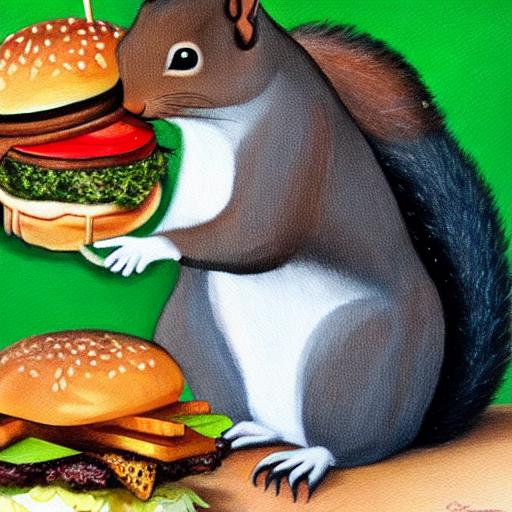

In [13]:
g_cpu = torch.Generator().manual_seed(8888)
prompts = ["A painting of a squirrel eating a burger"]
controller = AttentionStore()
_, x_t = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)
torch.cuda.empty_cache()

torch.save(x_t, "latent.pt")

## CLIP Interpolation

  0%|          | 0/51 [00:00<?, ?it/s]

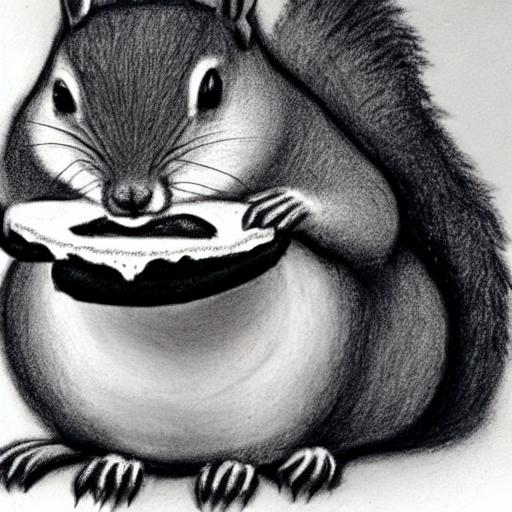

  0%|          | 0/51 [00:00<?, ?it/s]

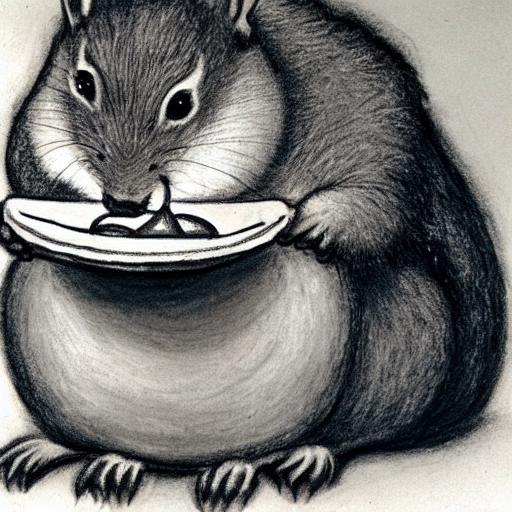

  0%|          | 0/51 [00:00<?, ?it/s]

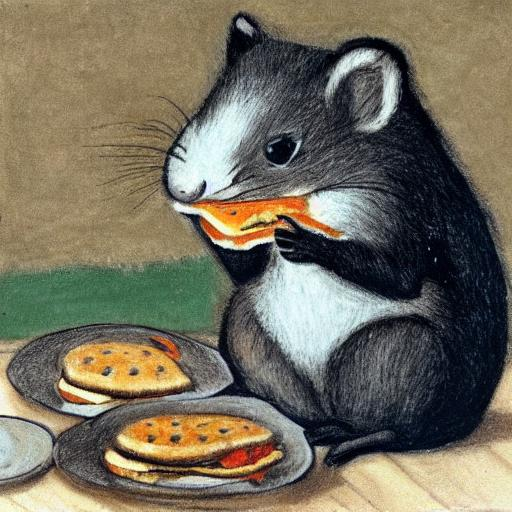

  0%|          | 0/51 [00:00<?, ?it/s]

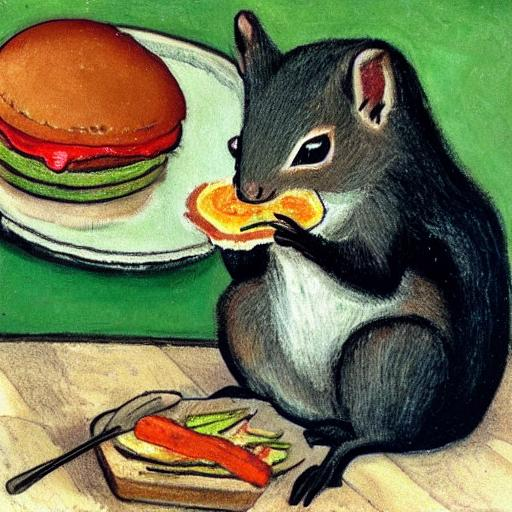

  0%|          | 0/51 [00:00<?, ?it/s]

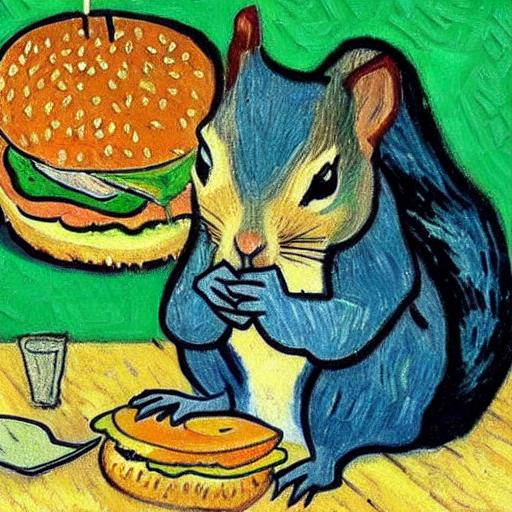

In [22]:
prompts = ["A charcoal drawing of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger"]

for i in range(5):
  p = i/4
  controller = AttentionStore()
  _, x_t = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu, clip_alpha=p, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

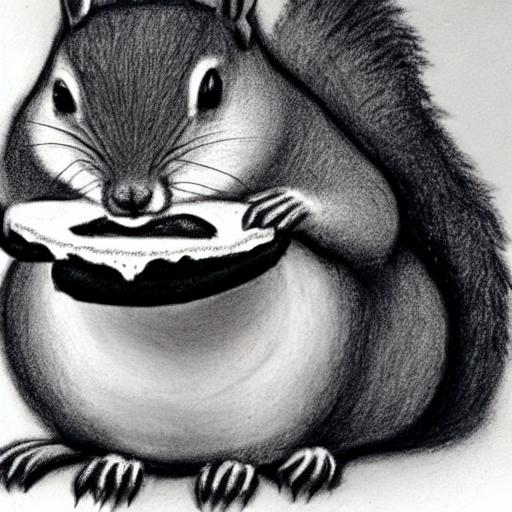

  0%|          | 0/51 [00:00<?, ?it/s]

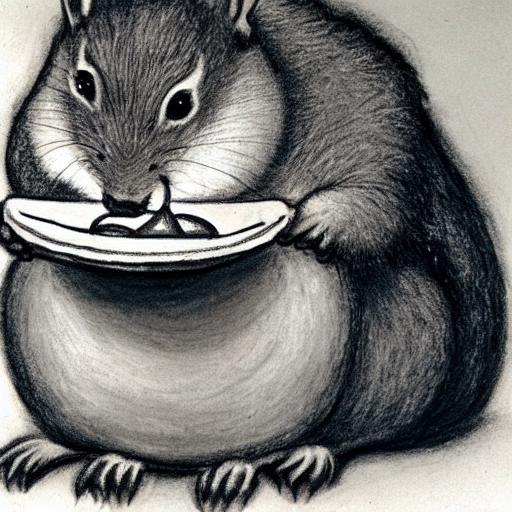

  0%|          | 0/51 [00:00<?, ?it/s]

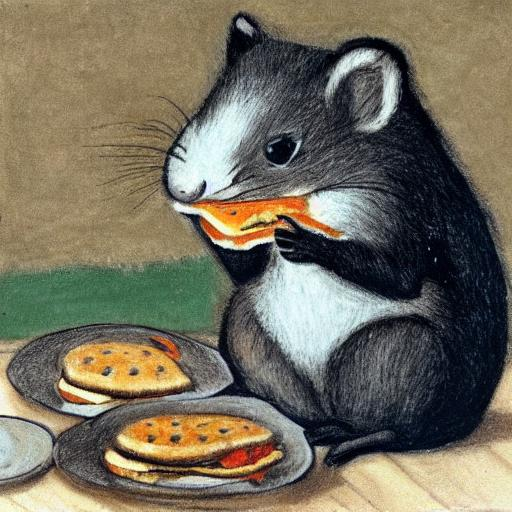

  0%|          | 0/51 [00:00<?, ?it/s]

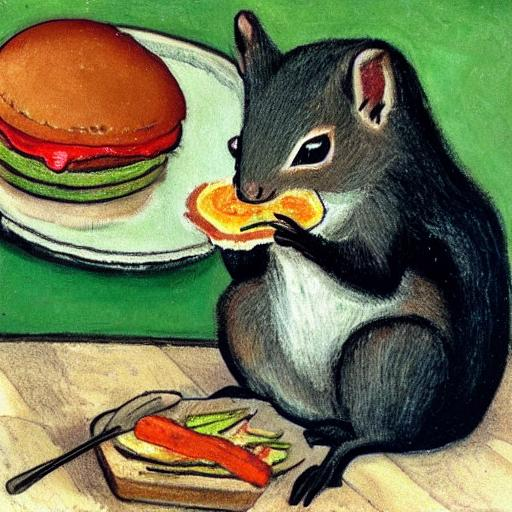

  0%|          | 0/51 [00:00<?, ?it/s]

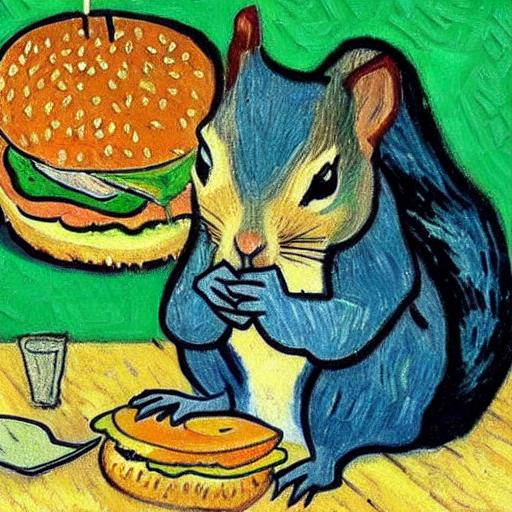

In [23]:
prompts = ["A charcoal drawing of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger"]

for i in range(5):
  p = i/4
  controller = AttentionStore()
  _, x_t = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu, clip_alpha=p, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

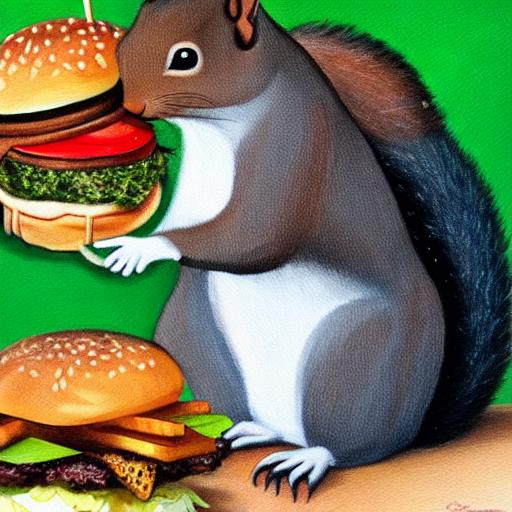

  0%|          | 0/51 [00:00<?, ?it/s]

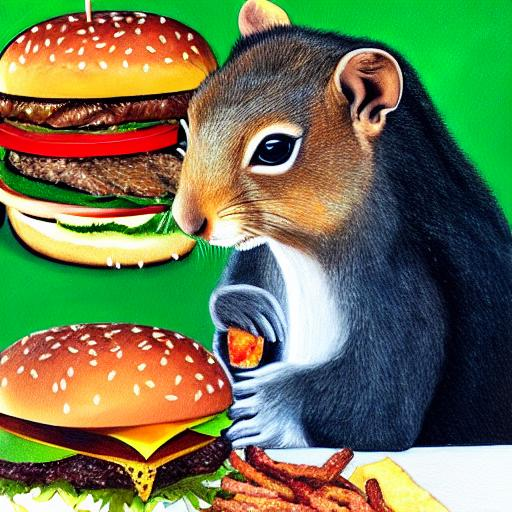

  0%|          | 0/51 [00:00<?, ?it/s]

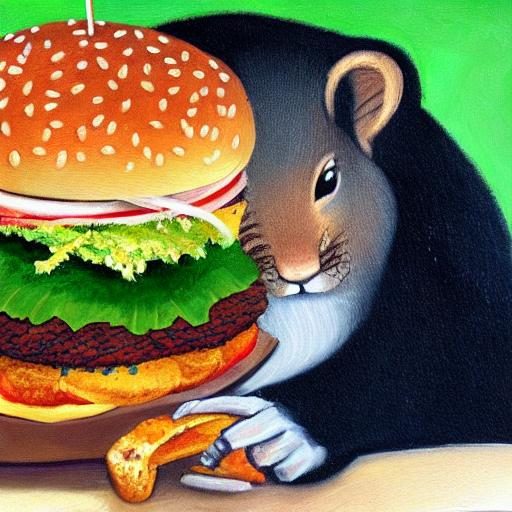

  0%|          | 0/51 [00:00<?, ?it/s]

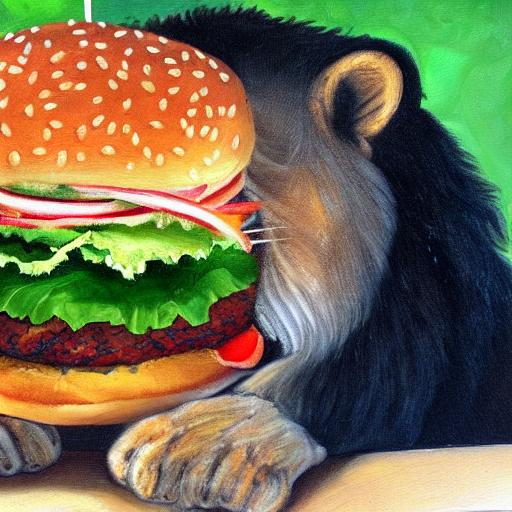

  0%|          | 0/51 [00:00<?, ?it/s]

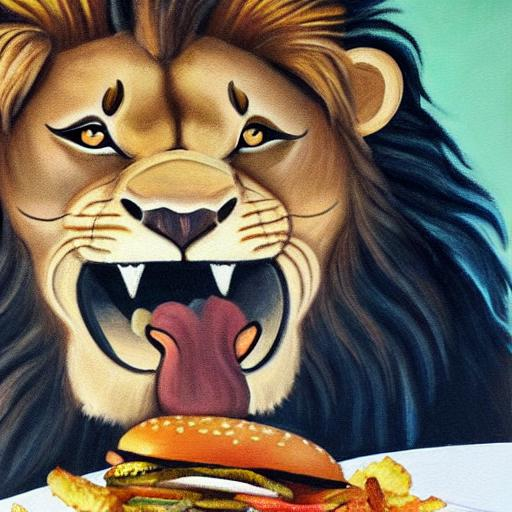

In [24]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

for i in range(5):
  p = i/4
  controller = AttentionStore()
  _, x_t = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu, clip_alpha=p, result_only=True)


  0%|          | 0/51 [00:00<?, ?it/s]

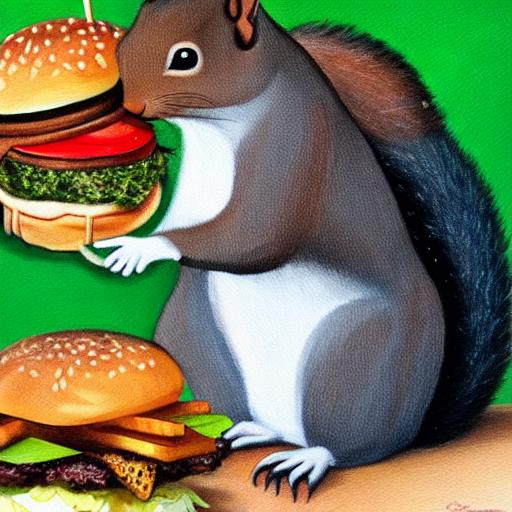

  0%|          | 0/51 [00:00<?, ?it/s]

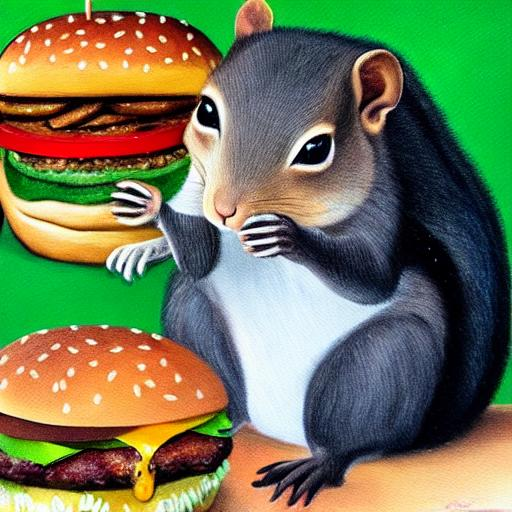

  0%|          | 0/51 [00:00<?, ?it/s]

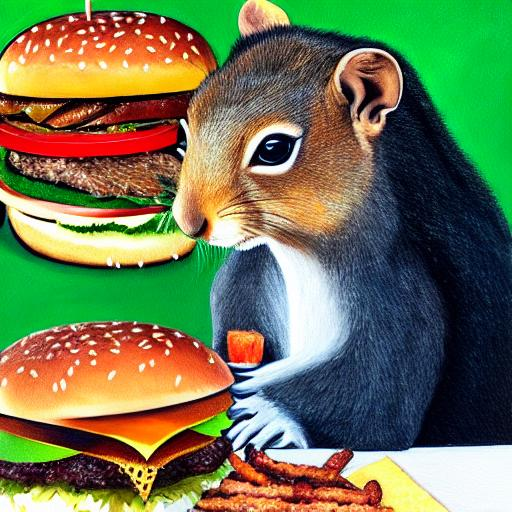

  0%|          | 0/51 [00:00<?, ?it/s]

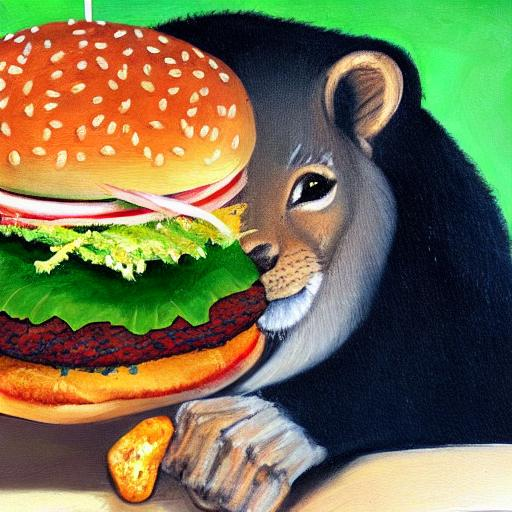

  0%|          | 0/51 [00:00<?, ?it/s]

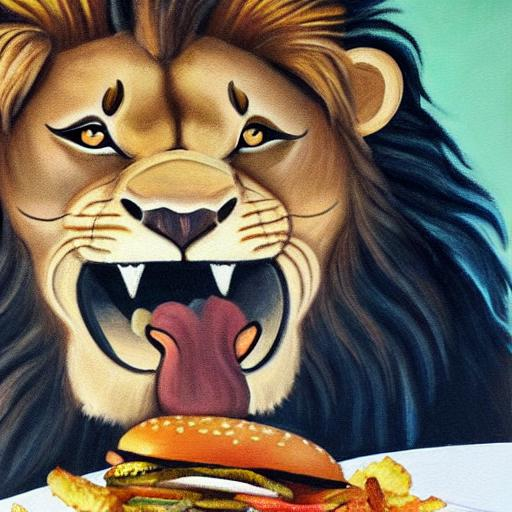

In [25]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

for i in range(5):
  p = i/4
  controller = AttentionStore()
  _, x_t = run_and_display(prompts, controller, latent=x_t, run_baseline=False, generator=g_cpu, clip_alpha=p, clip_interp="slerp", result_only=True)

## Attention Interpolation

  0%|          | 0/51 [00:00<?, ?it/s]

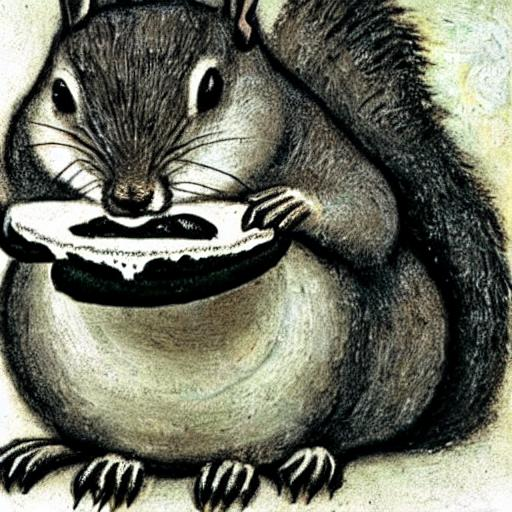

  0%|          | 0/51 [00:00<?, ?it/s]

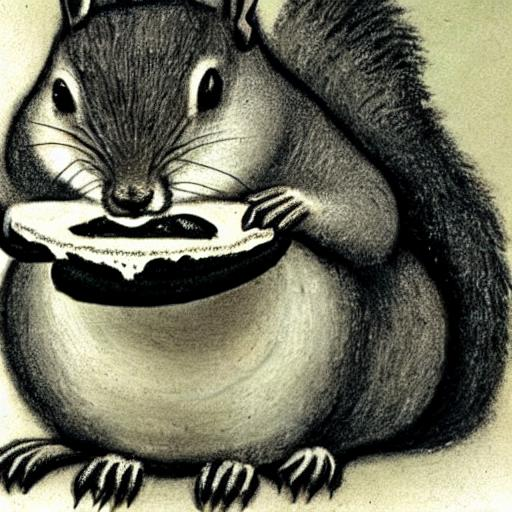

  0%|          | 0/51 [00:00<?, ?it/s]

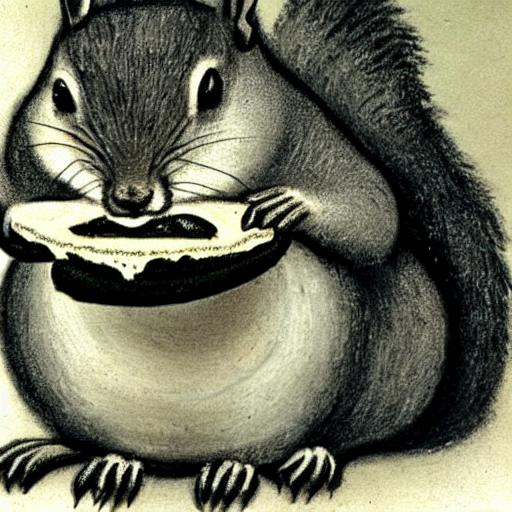

  0%|          | 0/51 [00:00<?, ?it/s]

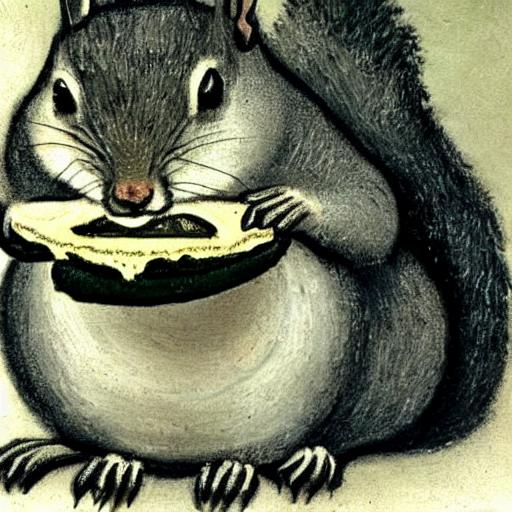

  0%|          | 0/51 [00:00<?, ?it/s]

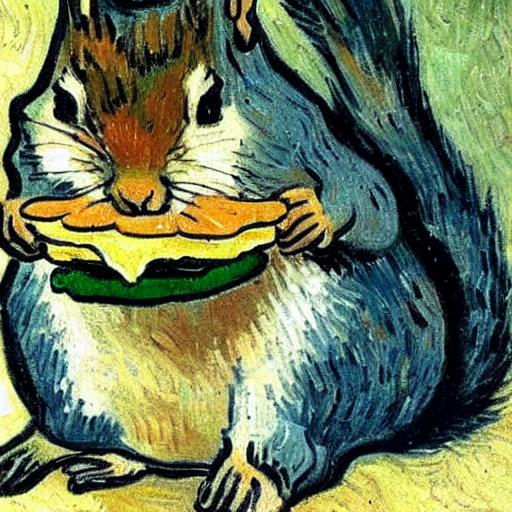

In [27]:
prompts = ["A charcoal drawing of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger"]

controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4)

for i in range(5):
  p = i/4
  controller = AttentionInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=1, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

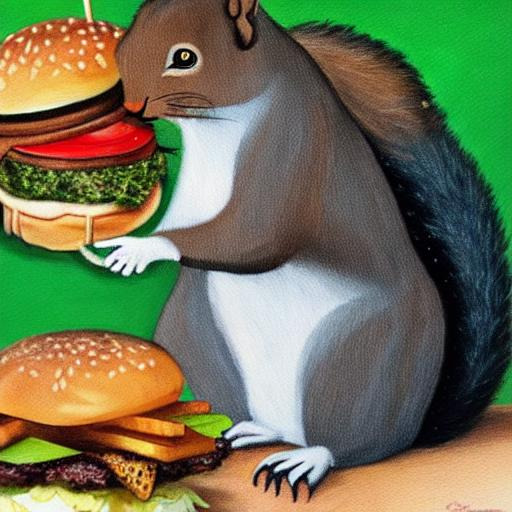

  0%|          | 0/51 [00:00<?, ?it/s]

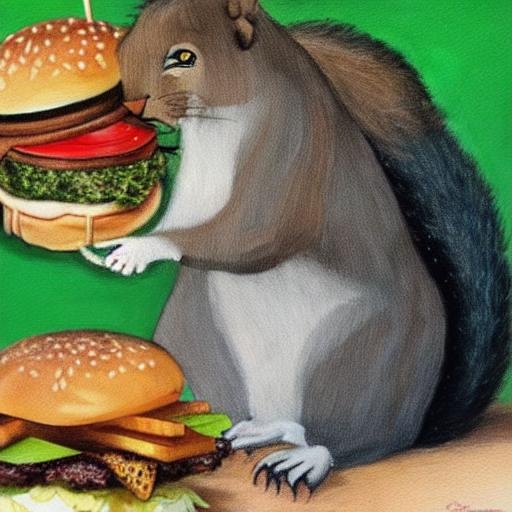

  0%|          | 0/51 [00:00<?, ?it/s]

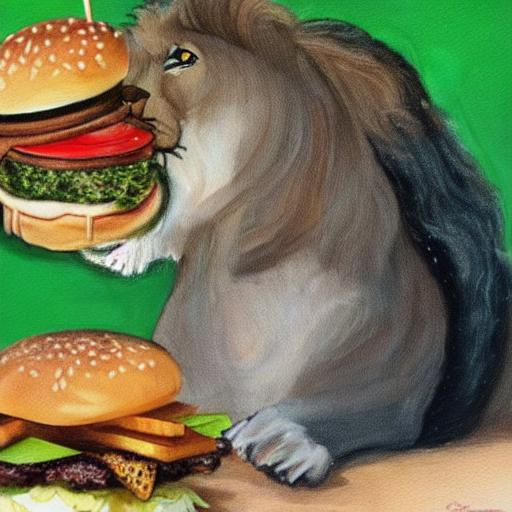

  0%|          | 0/51 [00:00<?, ?it/s]

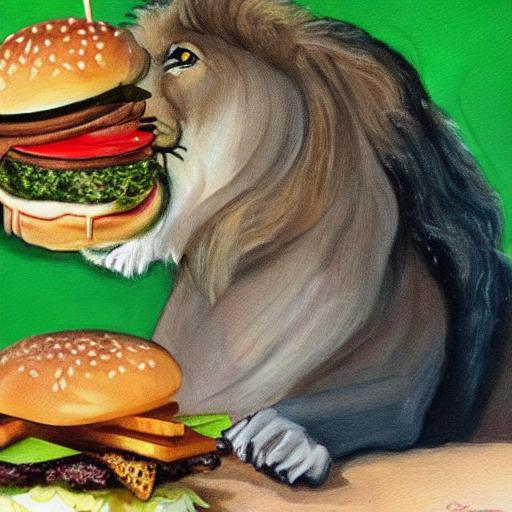

  0%|          | 0/51 [00:00<?, ?it/s]

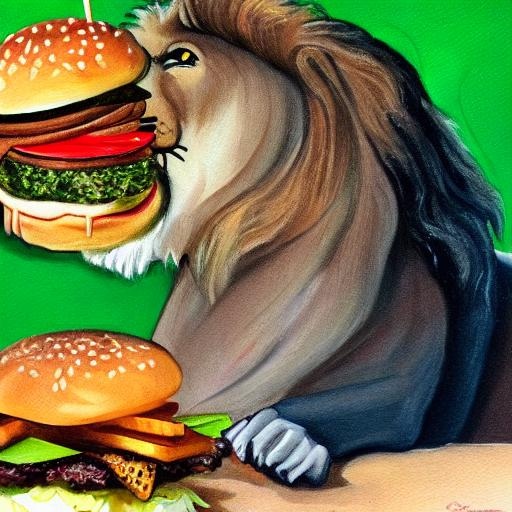

In [28]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

lb = LocalBlend(prompts, [("squirrel","lion")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger", ""]

for i in range(5):
  p = i/4
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=1, result_only=True)

## Attention + CLIP

First version: base & result images in parallel

linear CLIP

  0%|          | 0/51 [00:00<?, ?it/s]

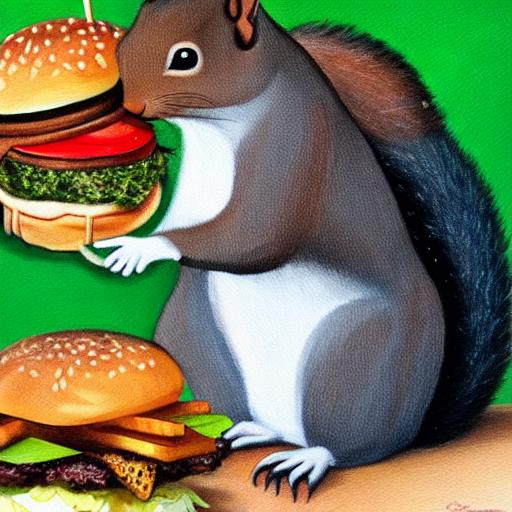

  0%|          | 0/51 [00:00<?, ?it/s]

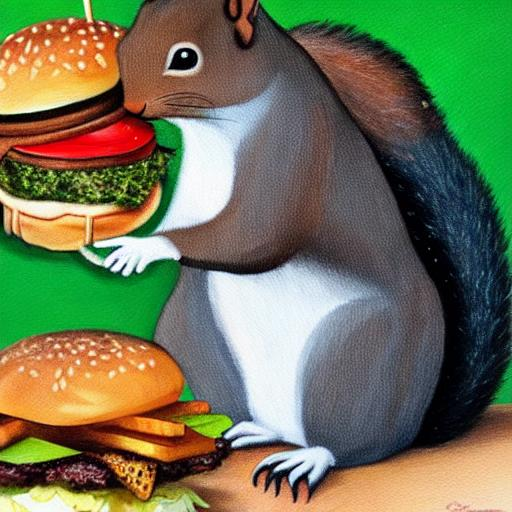

  0%|          | 0/51 [00:00<?, ?it/s]

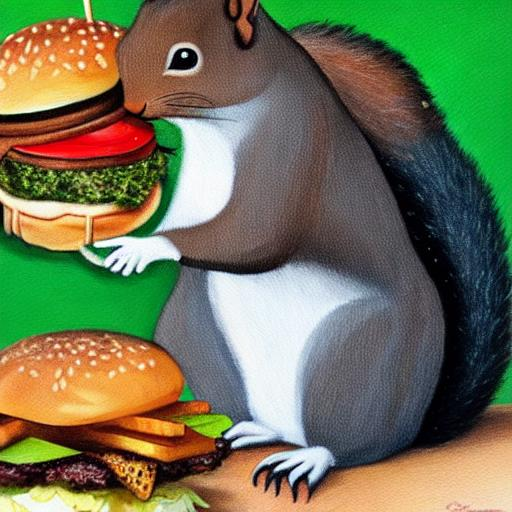

  0%|          | 0/51 [00:00<?, ?it/s]

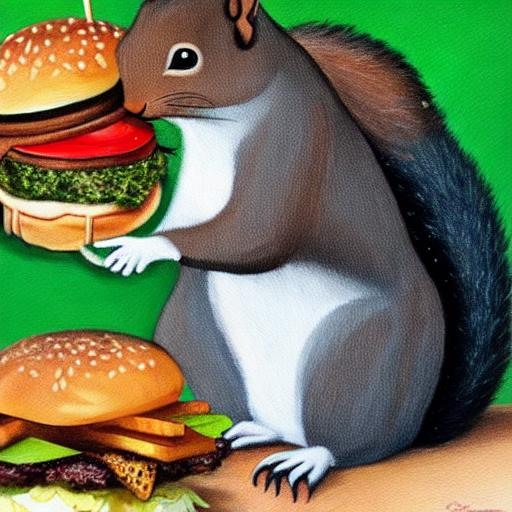

  0%|          | 0/51 [00:00<?, ?it/s]

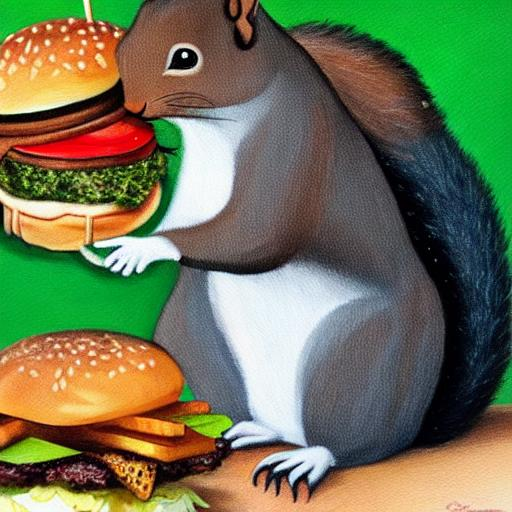

  0%|          | 0/51 [00:00<?, ?it/s]

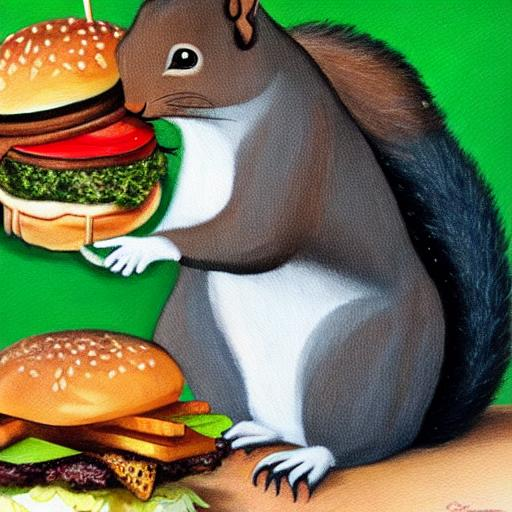

  0%|          | 0/51 [00:00<?, ?it/s]

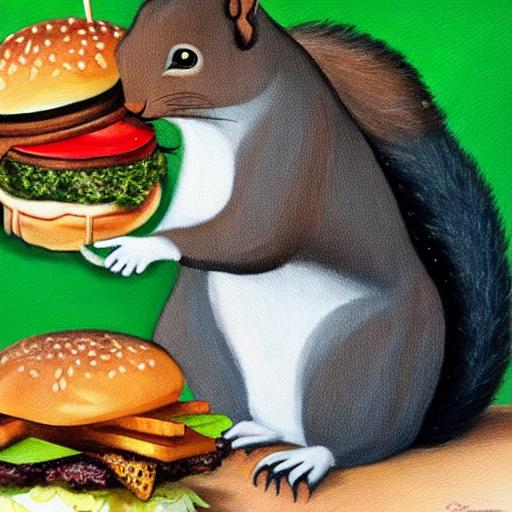

  0%|          | 0/51 [00:00<?, ?it/s]

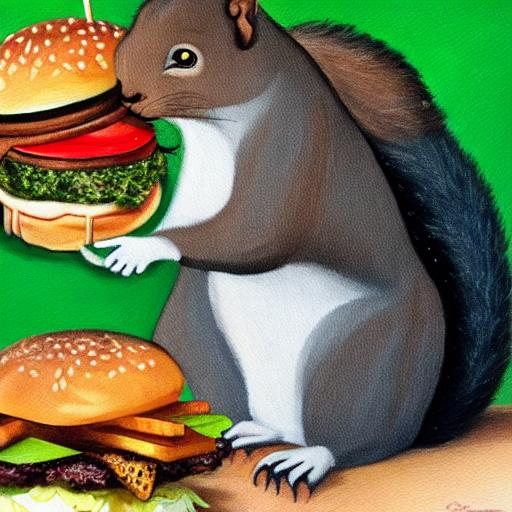

  0%|          | 0/51 [00:00<?, ?it/s]

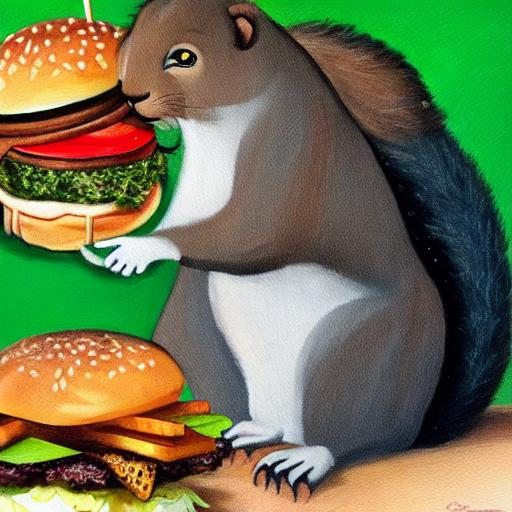

  0%|          | 0/51 [00:00<?, ?it/s]

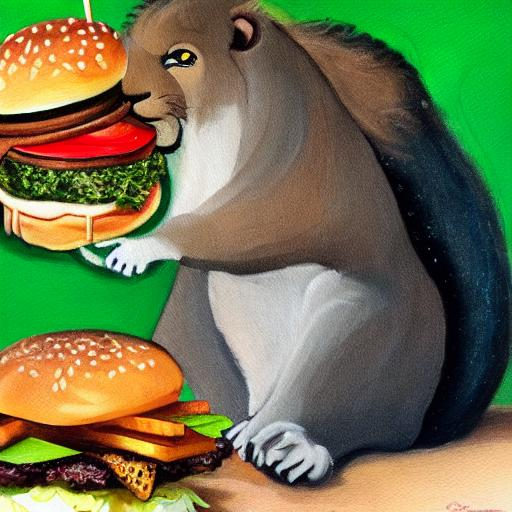

  0%|          | 0/51 [00:00<?, ?it/s]

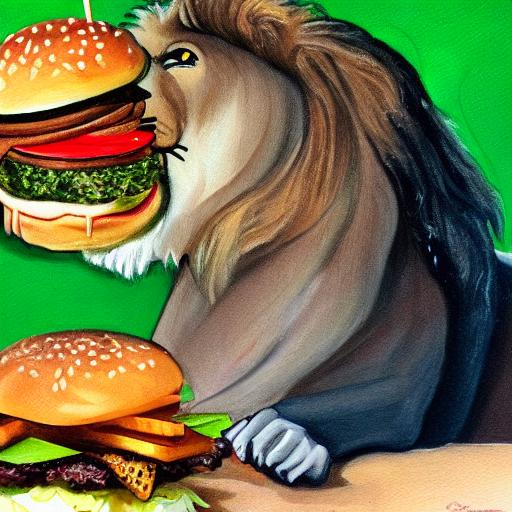

In [29]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

lb = LocalBlend(prompts, [("squirrel","lion")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

for i in range(11):
  p = i/10
  controller = AttentionInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

slerp CLIP

  0%|          | 0/51 [00:00<?, ?it/s]

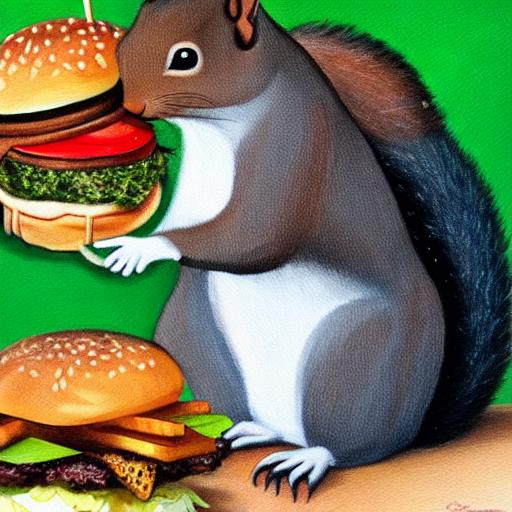

  0%|          | 0/51 [00:00<?, ?it/s]

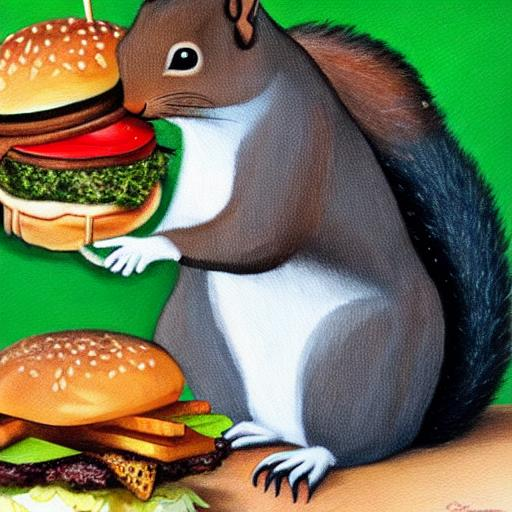

  0%|          | 0/51 [00:00<?, ?it/s]

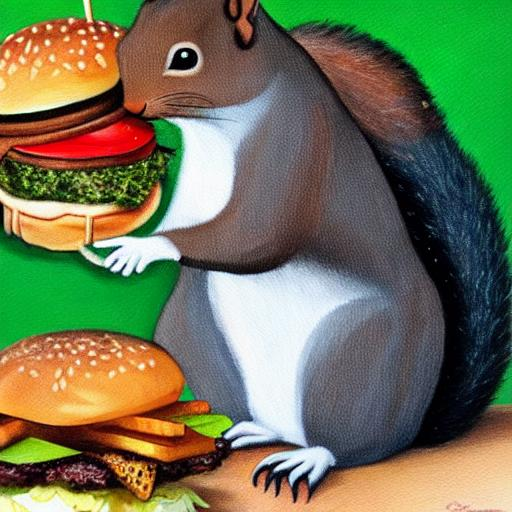

  0%|          | 0/51 [00:00<?, ?it/s]

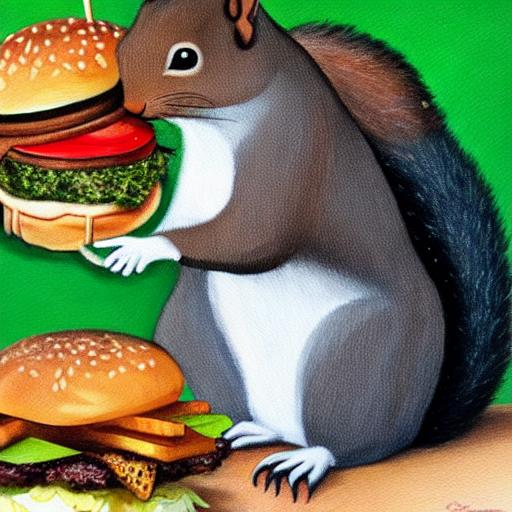

  0%|          | 0/51 [00:00<?, ?it/s]

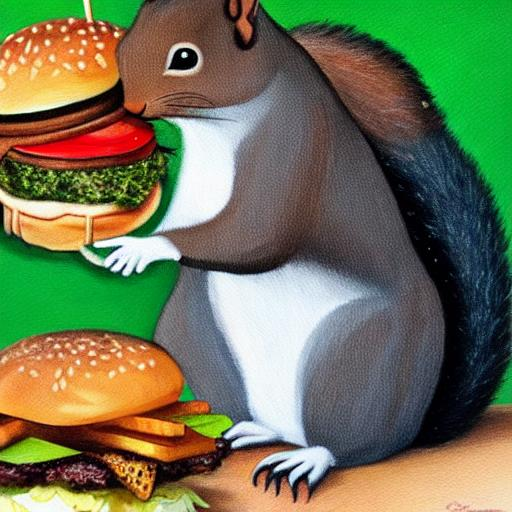

  0%|          | 0/51 [00:00<?, ?it/s]

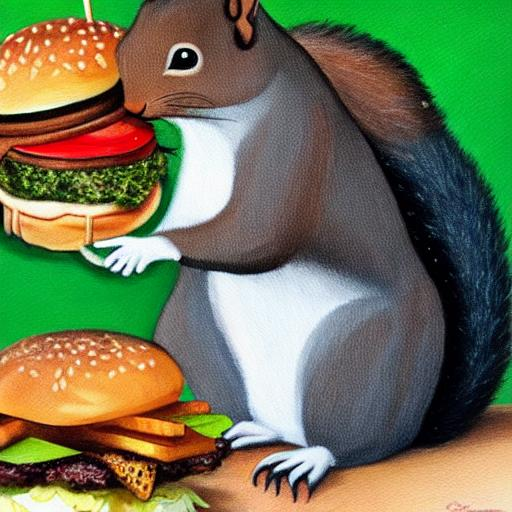

  0%|          | 0/51 [00:00<?, ?it/s]

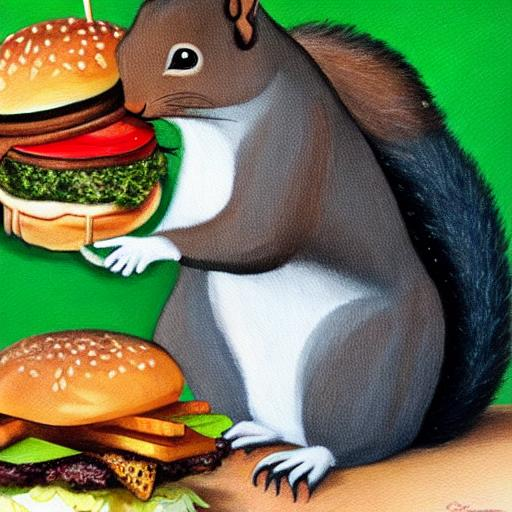

  0%|          | 0/51 [00:00<?, ?it/s]

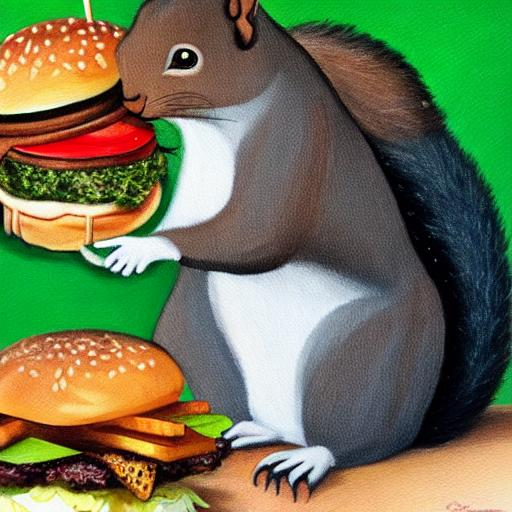

  0%|          | 0/51 [00:00<?, ?it/s]

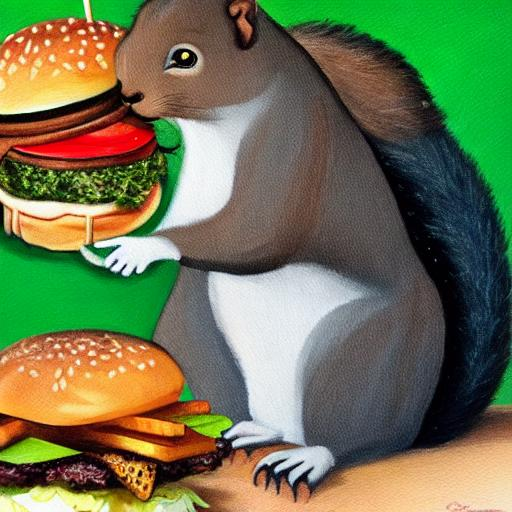

  0%|          | 0/51 [00:00<?, ?it/s]

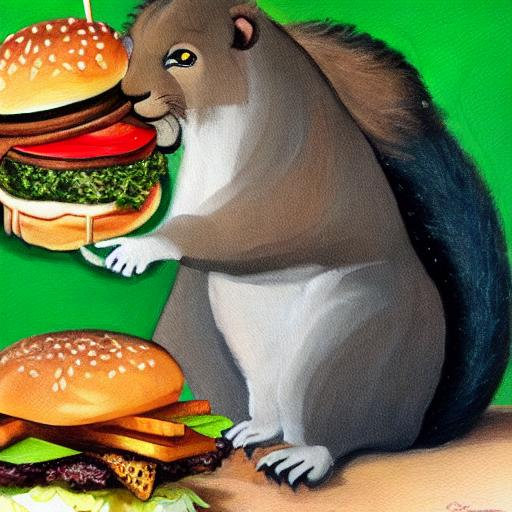

  0%|          | 0/51 [00:00<?, ?it/s]

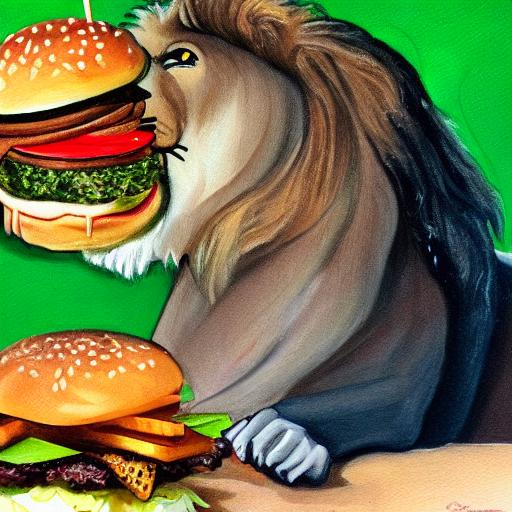

In [30]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

lb = LocalBlend(prompts, [("squirrel","lion")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

for i in range(11):
  p = i/10
  controller = AttentionInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, clip_interp="slerp", result_only=True)

## Full Attention Interpolate (Best results)

base, target & result images in parallel
linear clip

  0%|          | 0/51 [00:00<?, ?it/s]

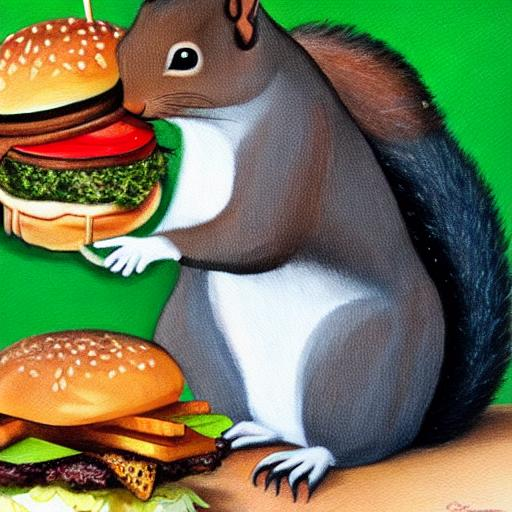

  0%|          | 0/51 [00:00<?, ?it/s]

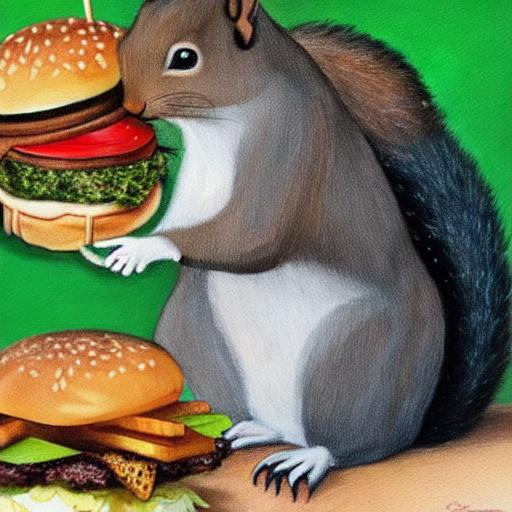

  0%|          | 0/51 [00:00<?, ?it/s]

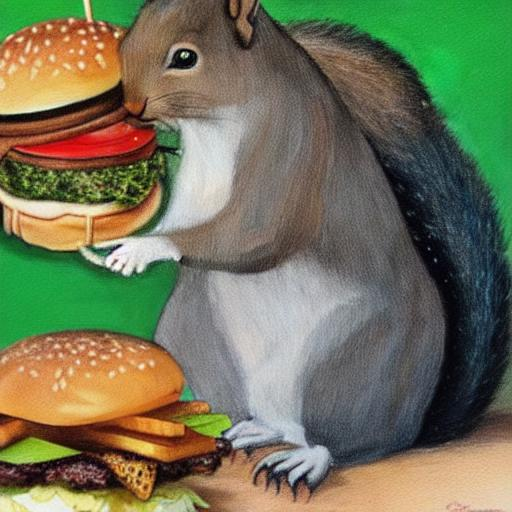

  0%|          | 0/51 [00:00<?, ?it/s]

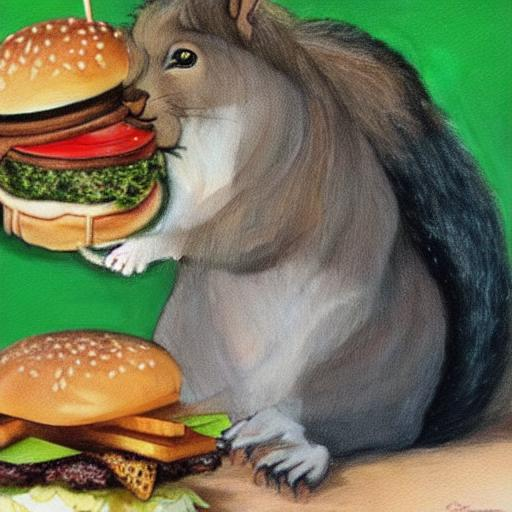

  0%|          | 0/51 [00:00<?, ?it/s]

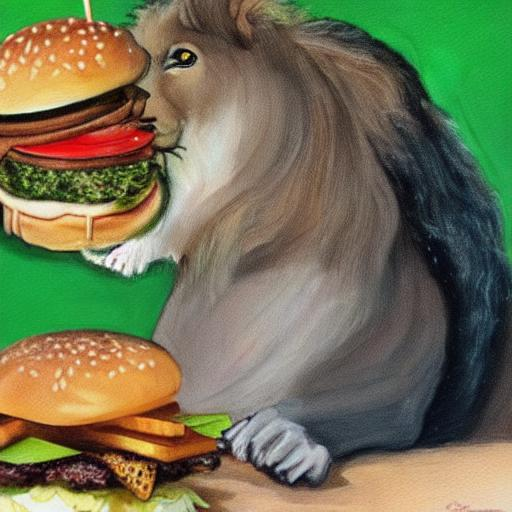

  0%|          | 0/51 [00:00<?, ?it/s]

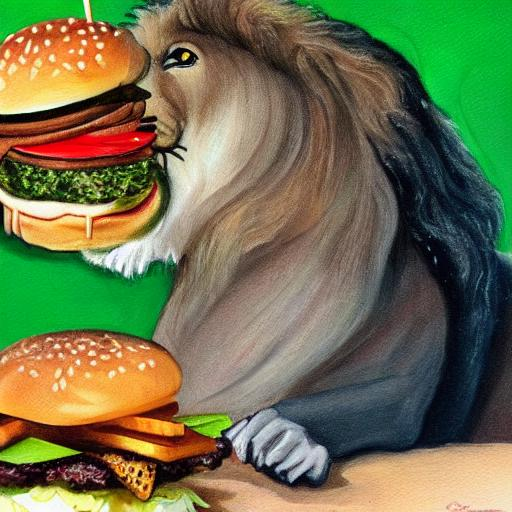

  0%|          | 0/51 [00:00<?, ?it/s]

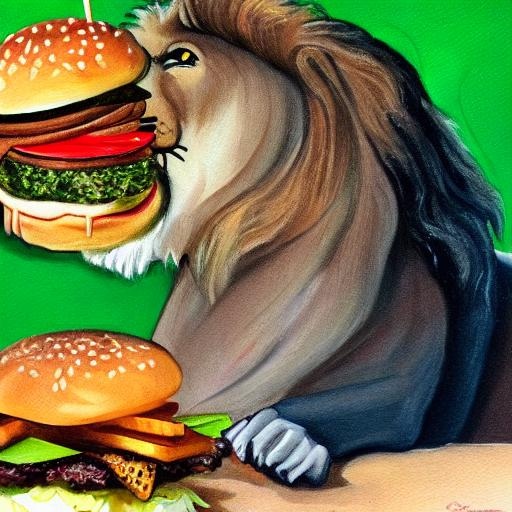

In [31]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]

lb = LocalBlend(prompts, [("squirrel","lion")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger",
           "A painting of a lion eating a burger"]

for i in range(7):
  p = i/6
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)


  0%|          | 0/51 [00:00<?, ?it/s]

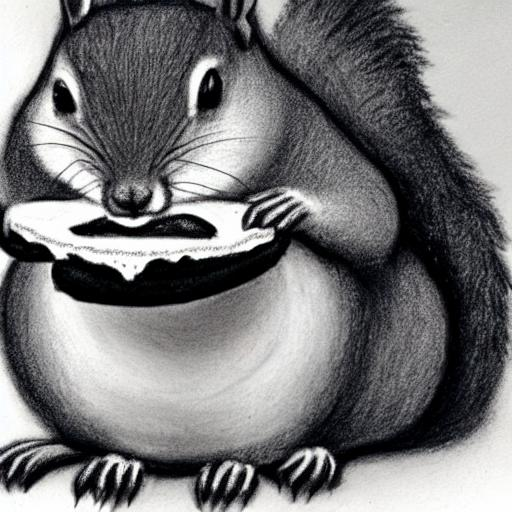

  0%|          | 0/51 [00:00<?, ?it/s]

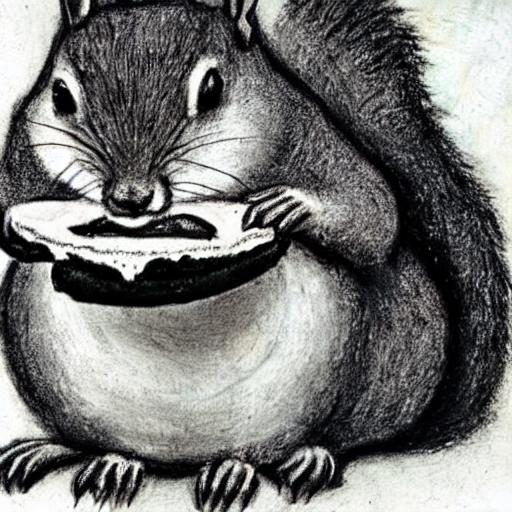

  0%|          | 0/51 [00:00<?, ?it/s]

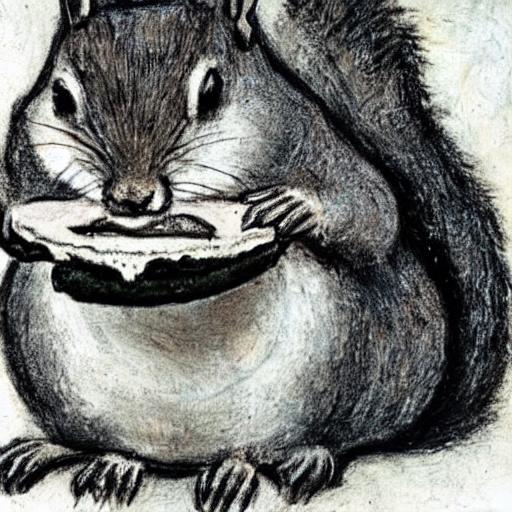

  0%|          | 0/51 [00:00<?, ?it/s]

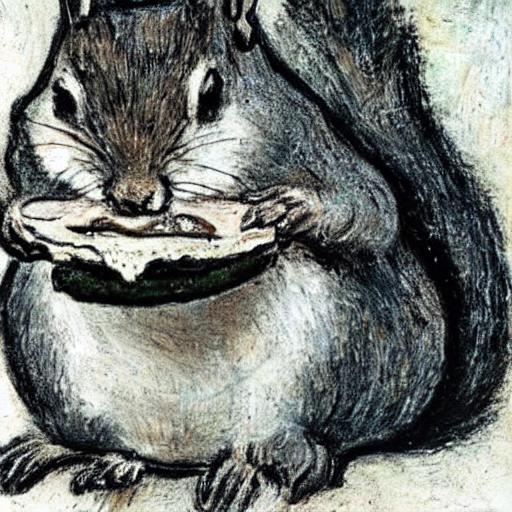

  0%|          | 0/51 [00:00<?, ?it/s]

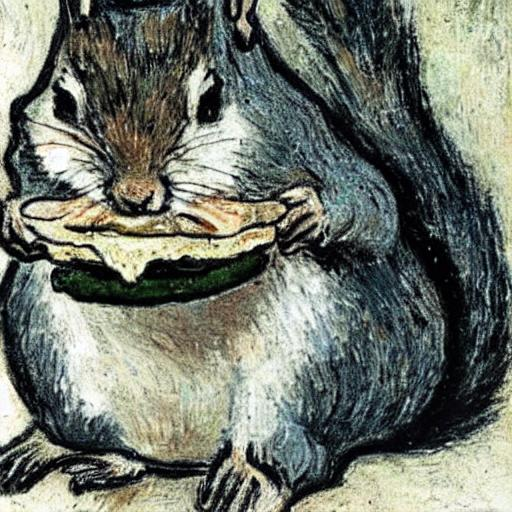

  0%|          | 0/51 [00:00<?, ?it/s]

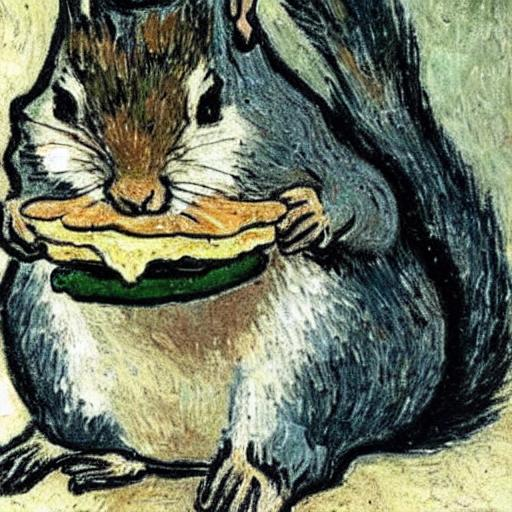

  0%|          | 0/51 [00:00<?, ?it/s]

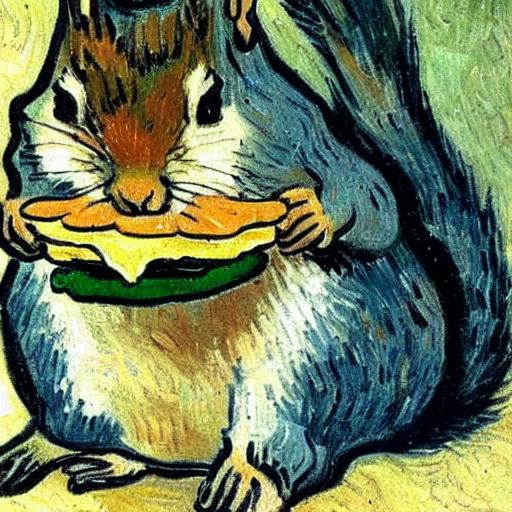

In [32]:
prompts = ["A charcoal drawing of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger"]

controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A charcoal drawing of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger",
           "A painting by Van Gogh of a squirrel eating a burger"]

for i in range(7):
  p = i/6
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)


  0%|          | 0/51 [00:00<?, ?it/s]

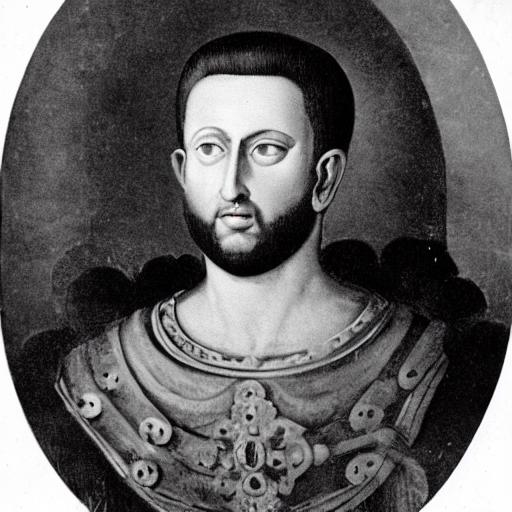

  0%|          | 0/51 [00:00<?, ?it/s]

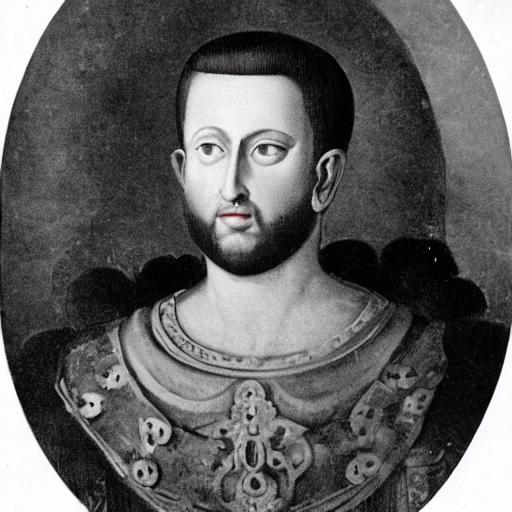

  0%|          | 0/51 [00:00<?, ?it/s]

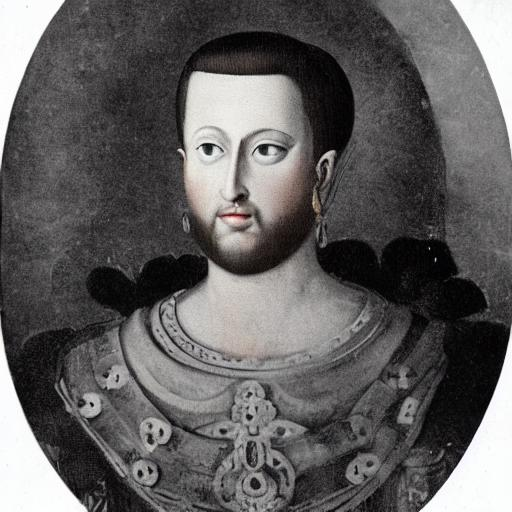

  0%|          | 0/51 [00:00<?, ?it/s]

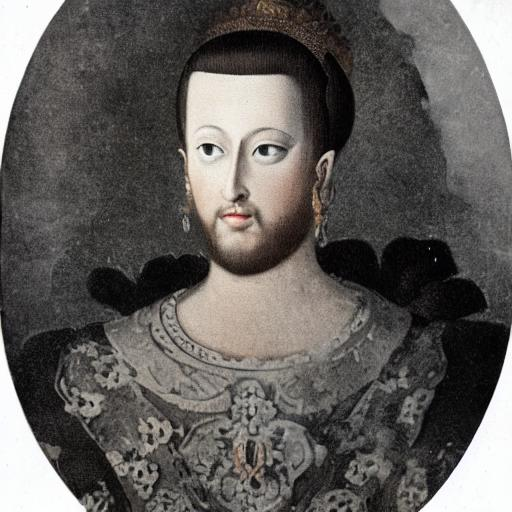

  0%|          | 0/51 [00:00<?, ?it/s]

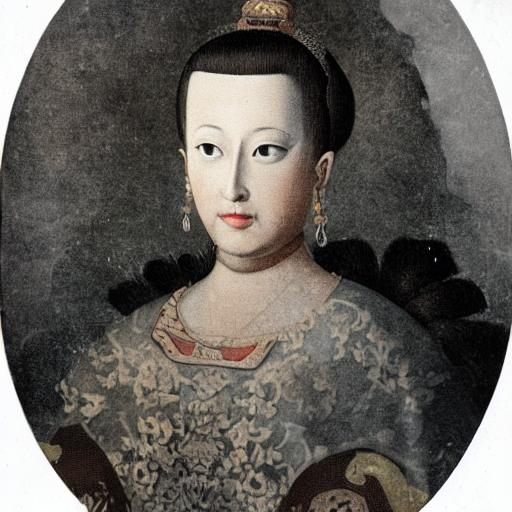

  0%|          | 0/51 [00:00<?, ?it/s]

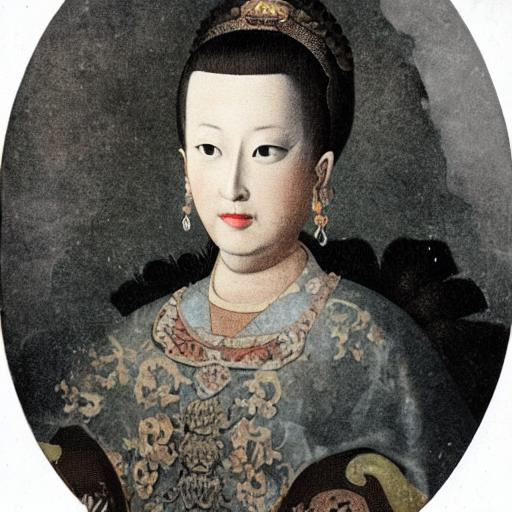

  0%|          | 0/51 [00:00<?, ?it/s]

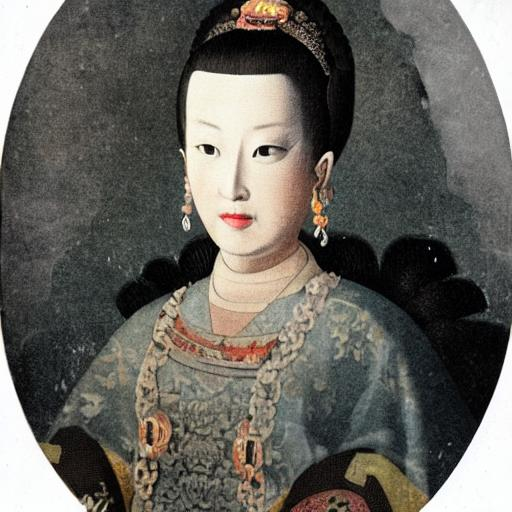

In [33]:
prompts = ["A portrait of a Roman Emperor",
           "A portrait of a Chinese Empress"]

lb = LocalBlend(prompts, [("Roman", "Chinese"),("Emperor", "Empress")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)

prompts = ["A portrait of a Roman Emperor",
           "A portrait of a Chinese Empress",
           "A portrait of a Chinese Empress"]

for i in range(7):
  p = i/6
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.85, self_replace_steps=0.6, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

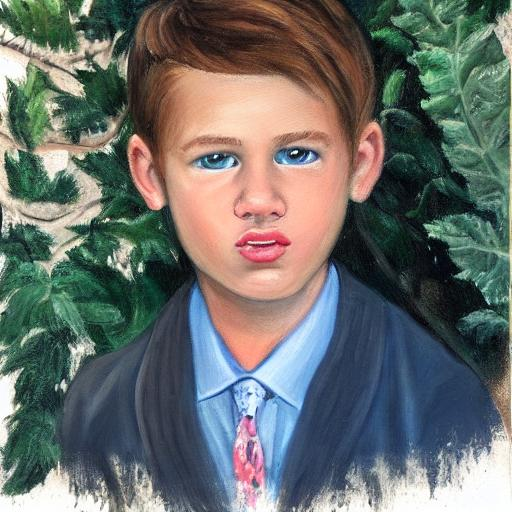

  0%|          | 0/51 [00:00<?, ?it/s]

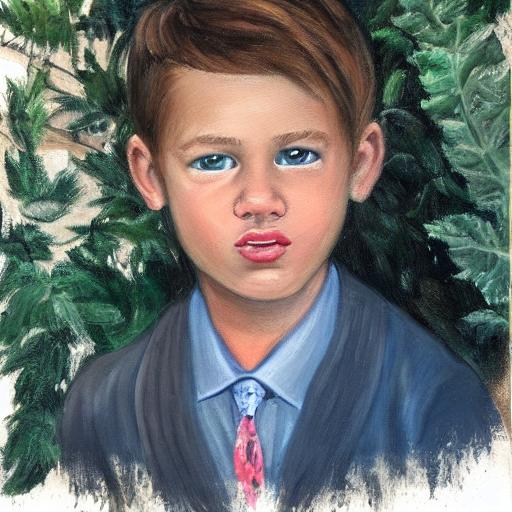

  0%|          | 0/51 [00:00<?, ?it/s]

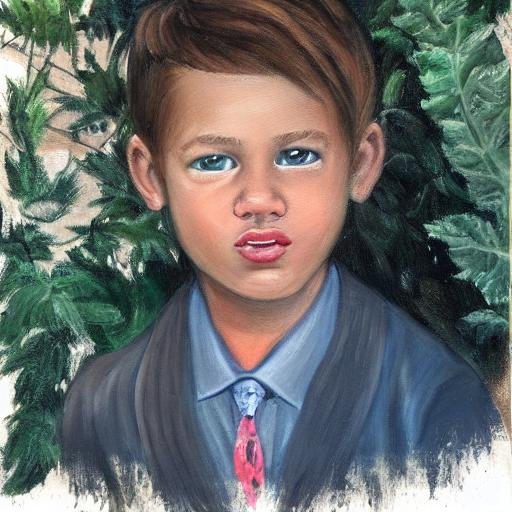

  0%|          | 0/51 [00:00<?, ?it/s]

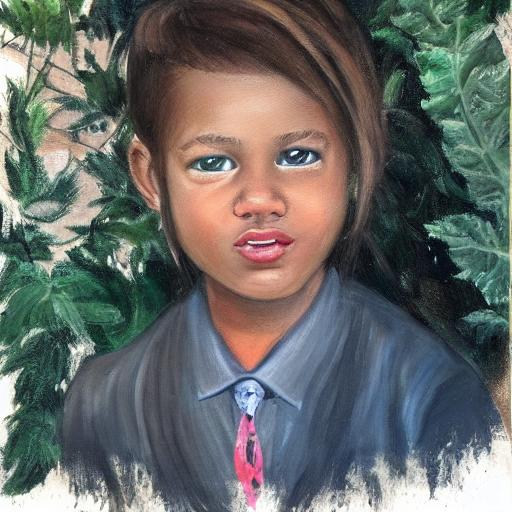

  0%|          | 0/51 [00:00<?, ?it/s]

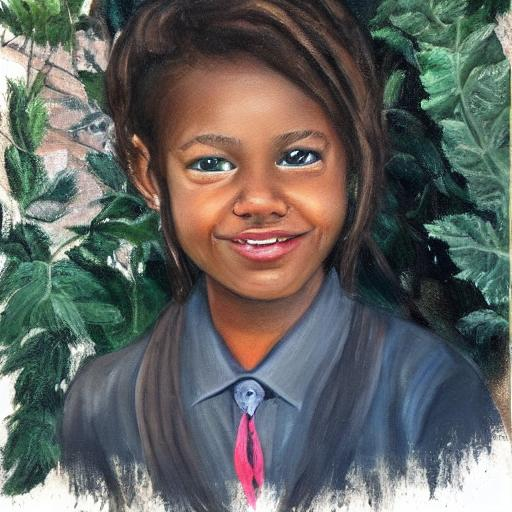

  0%|          | 0/51 [00:00<?, ?it/s]

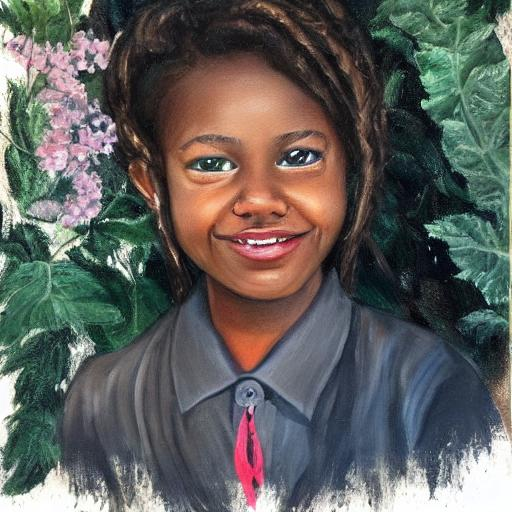

  0%|          | 0/51 [00:00<?, ?it/s]

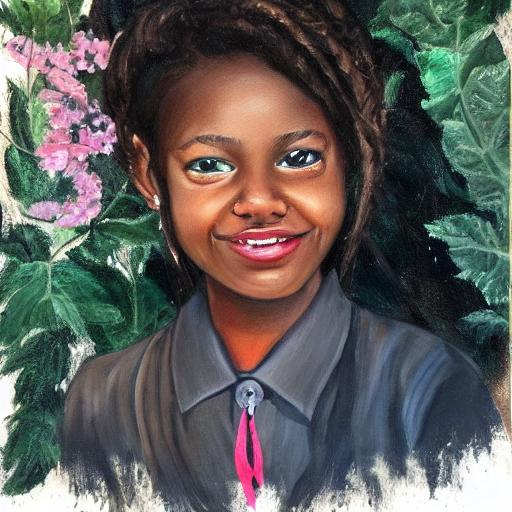

In [34]:
prompts = ["A realistic painting of a white boy",
           "A realistic painting of a black girl"]

lb = LocalBlend(prompts, [("white", "black"), ("boy", "girl")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)

prompts = ["A realistic painting of a white boy",
           "A realistic painting of a black girl",
           "A realistic painting of a black girl"]

for i in range(7):
  p = i/6
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.85, self_replace_steps=0.6, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

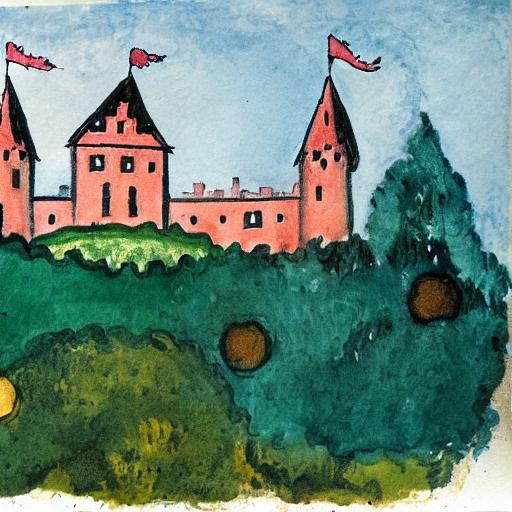

  0%|          | 0/51 [00:00<?, ?it/s]

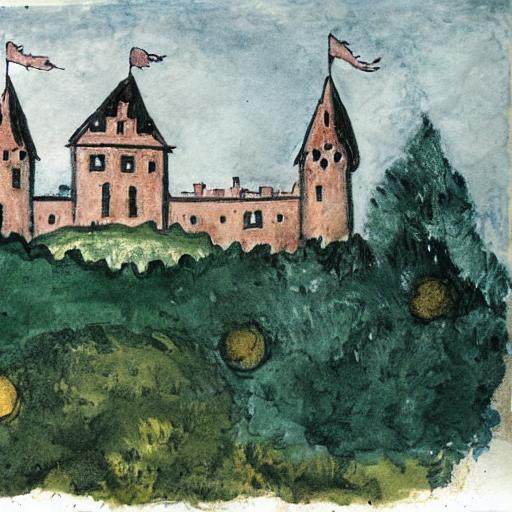

  0%|          | 0/51 [00:00<?, ?it/s]

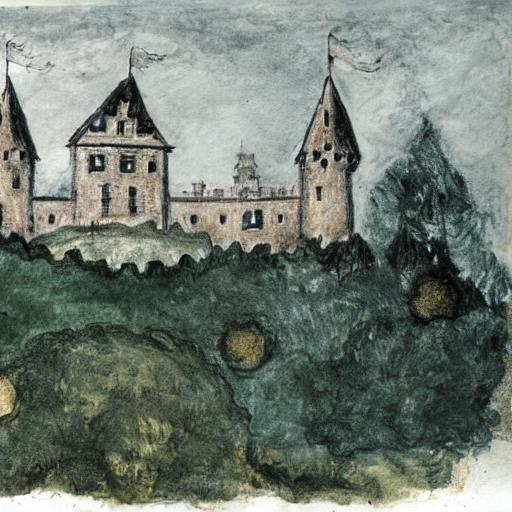

  0%|          | 0/51 [00:00<?, ?it/s]

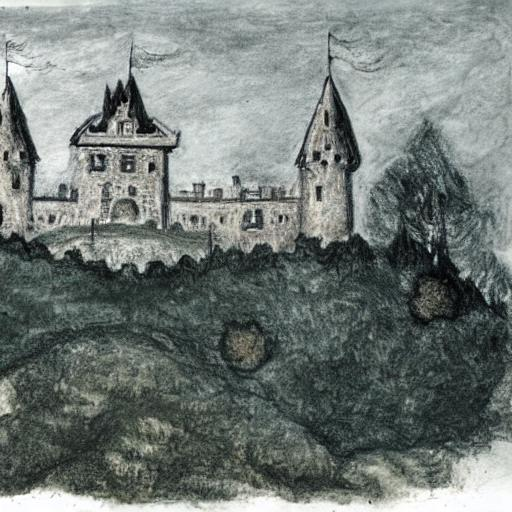

  0%|          | 0/51 [00:00<?, ?it/s]

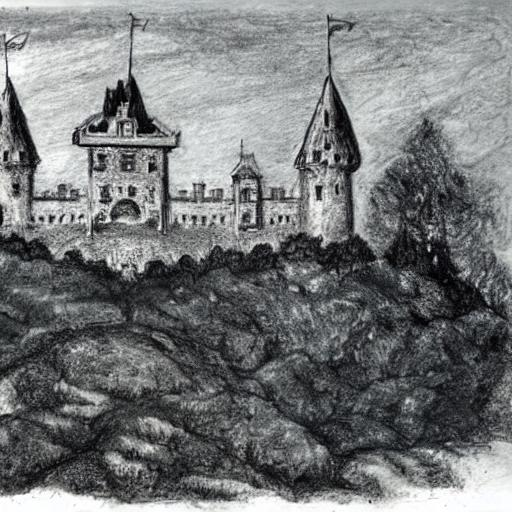

  0%|          | 0/51 [00:00<?, ?it/s]

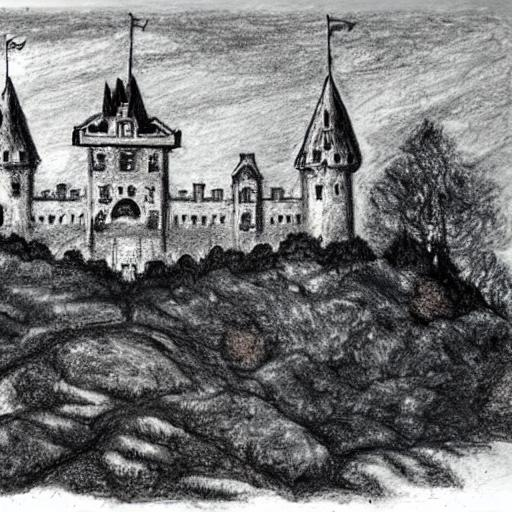

  0%|          | 0/51 [00:00<?, ?it/s]

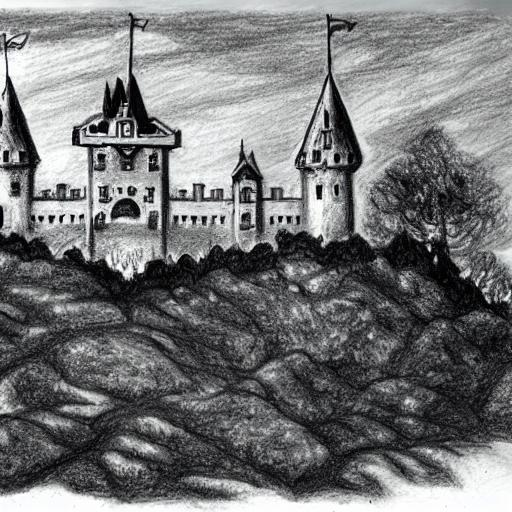

In [35]:
prompts = ["A children's painting of a large castle on a hill in the distance",
           "A drawing of a large fantasy castle on a hill in the distance"]


controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts += [""]

for i in range(7):
  p = i/6
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

## EXPERIMENTAL: Attention map interpolation techniques
linear (first) vs "blurpolate" (second)

  0%|          | 0/51 [00:00<?, ?it/s]

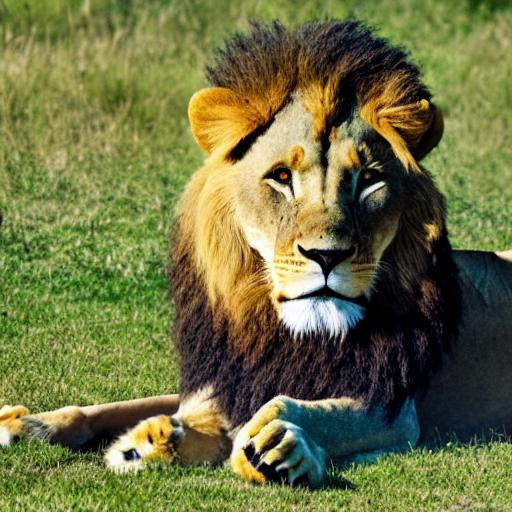

  0%|          | 0/51 [00:00<?, ?it/s]

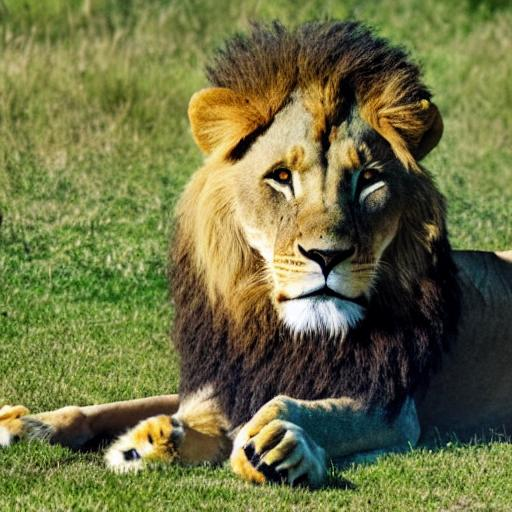

  0%|          | 0/51 [00:00<?, ?it/s]

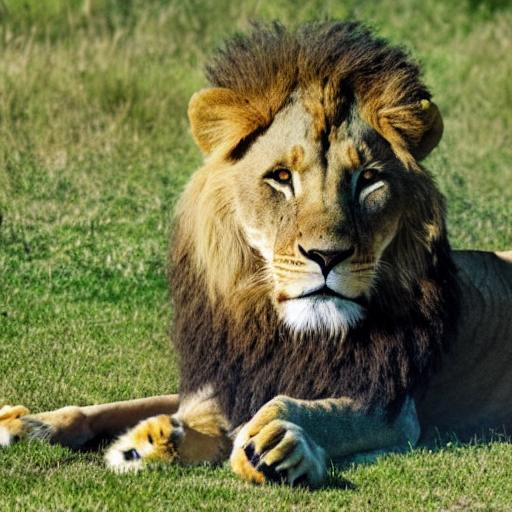

  0%|          | 0/51 [00:00<?, ?it/s]

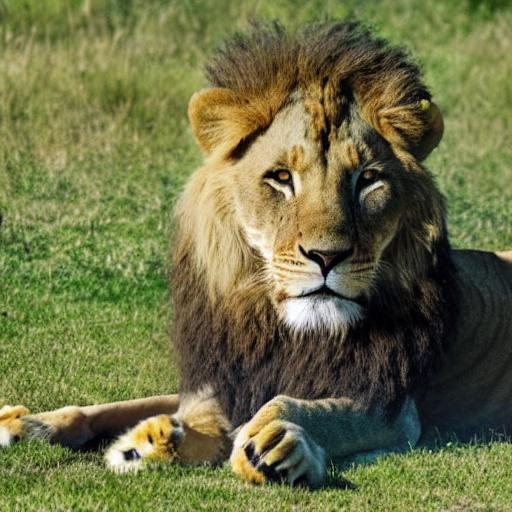

  0%|          | 0/51 [00:00<?, ?it/s]

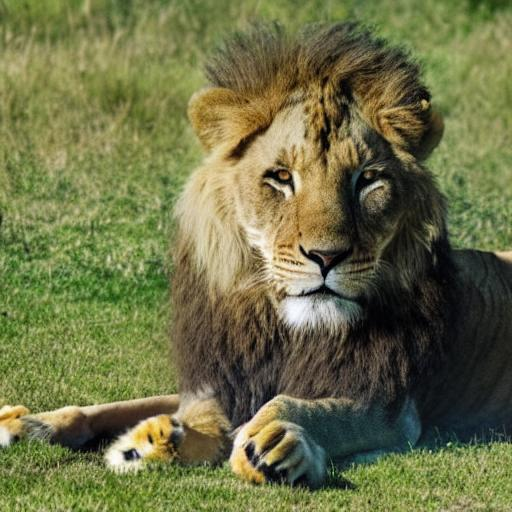

  0%|          | 0/51 [00:00<?, ?it/s]

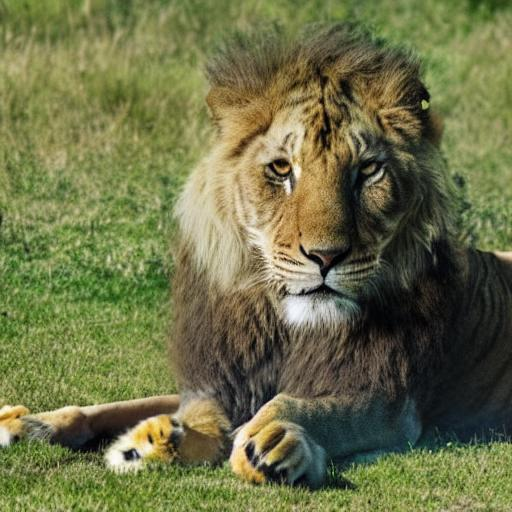

  0%|          | 0/51 [00:00<?, ?it/s]

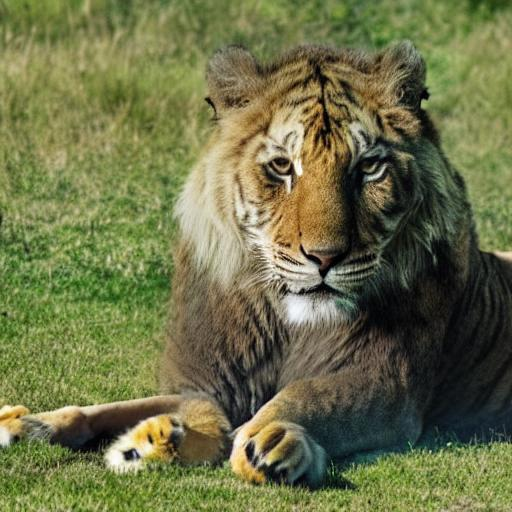

  0%|          | 0/51 [00:00<?, ?it/s]

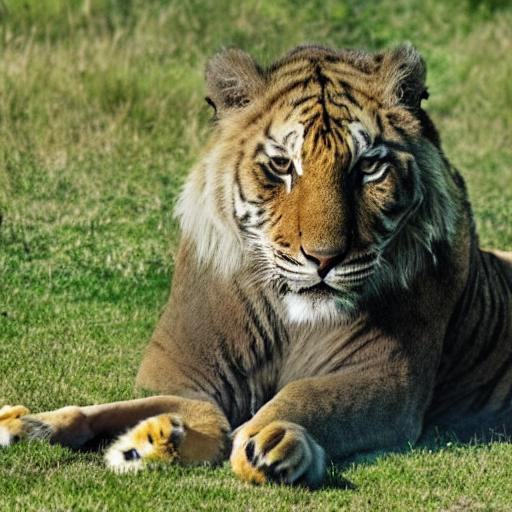

  0%|          | 0/51 [00:00<?, ?it/s]

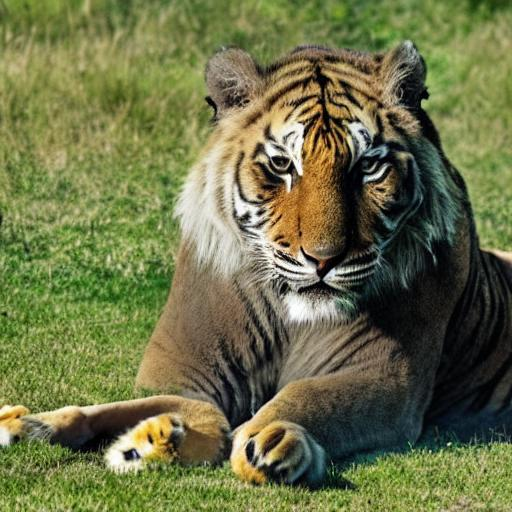

  0%|          | 0/51 [00:00<?, ?it/s]

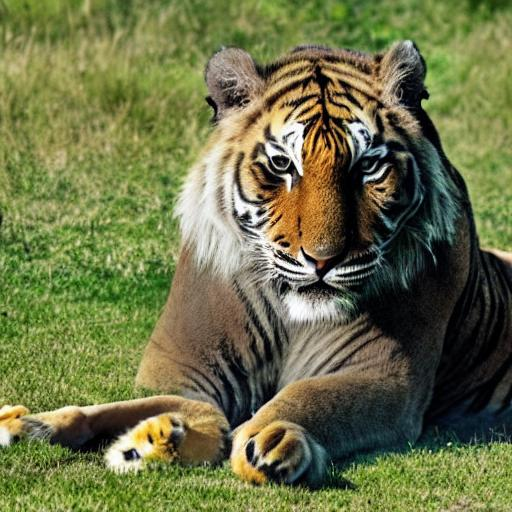

  0%|          | 0/51 [00:00<?, ?it/s]

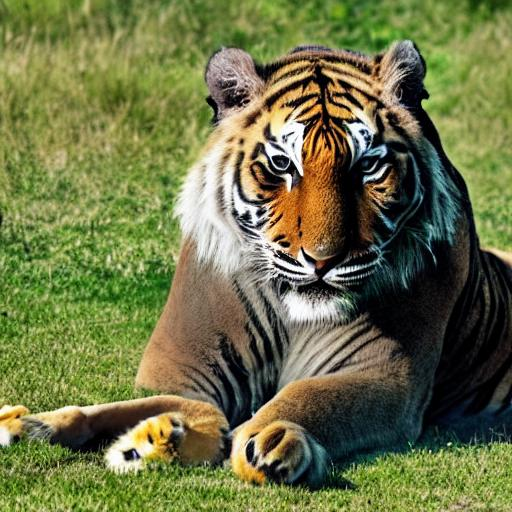

In [36]:
prompts = ["A picture of a lion lying in the grass",
           "A picture of a tiger lying in the grass"]

lb = LocalBlend(prompts, [("lion","tiger")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A picture of a lion lying in the grass",
           "A picture of a tiger lying in the grass",
           "A picture of a tiger lying in the grass"]

for i in range(11):
  p = i/10
  controller = AttentionFullInterpolate(p, prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

  0%|          | 0/51 [00:00<?, ?it/s]

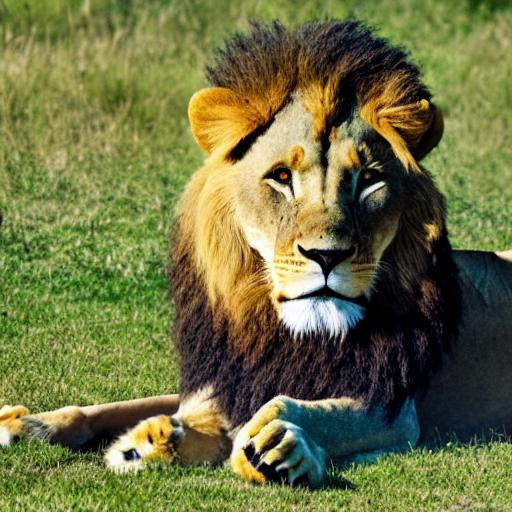

  0%|          | 0/51 [00:00<?, ?it/s]

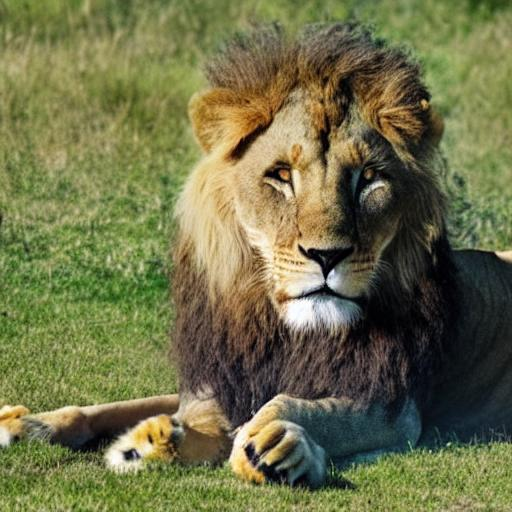

  0%|          | 0/51 [00:00<?, ?it/s]

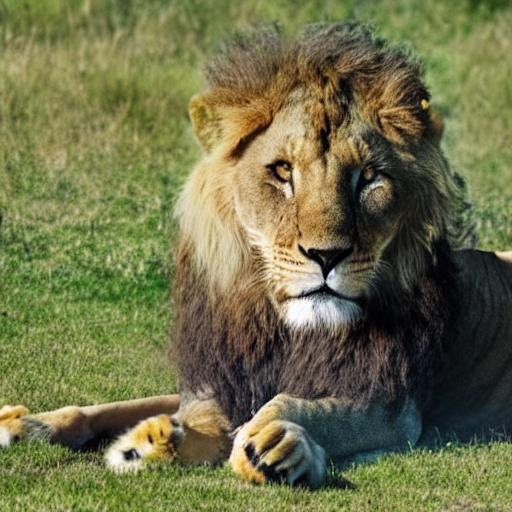

  0%|          | 0/51 [00:00<?, ?it/s]

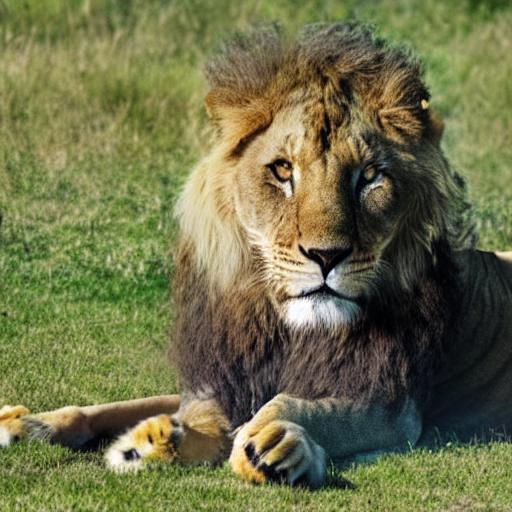

  0%|          | 0/51 [00:00<?, ?it/s]

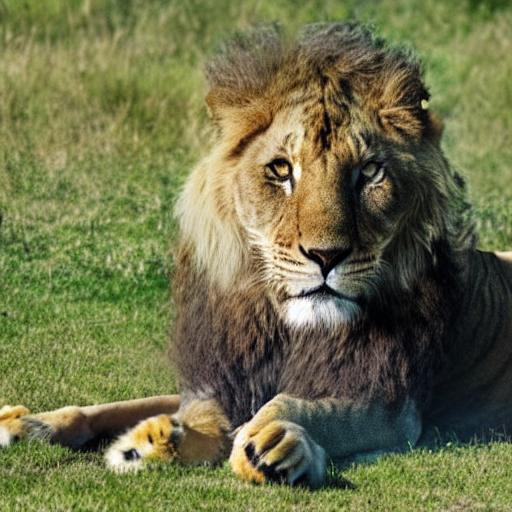

  0%|          | 0/51 [00:00<?, ?it/s]

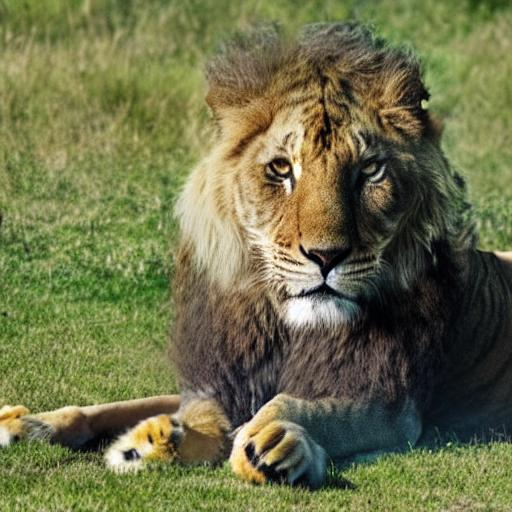

  0%|          | 0/51 [00:00<?, ?it/s]

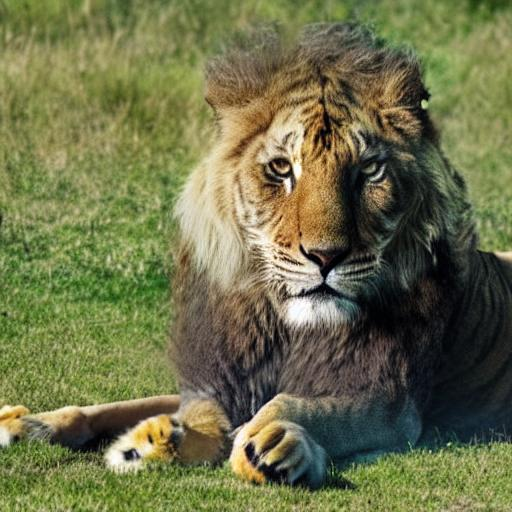

  0%|          | 0/51 [00:00<?, ?it/s]

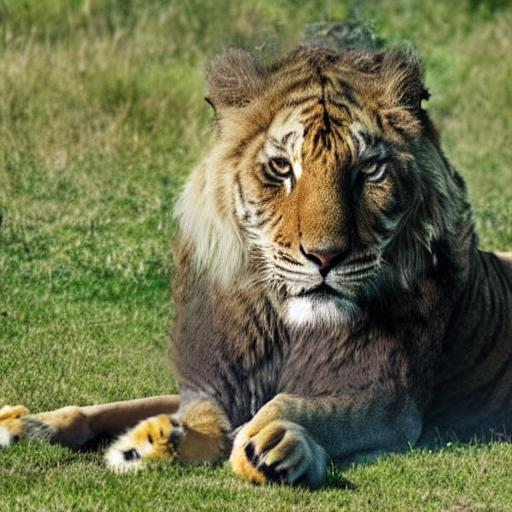

  0%|          | 0/51 [00:00<?, ?it/s]

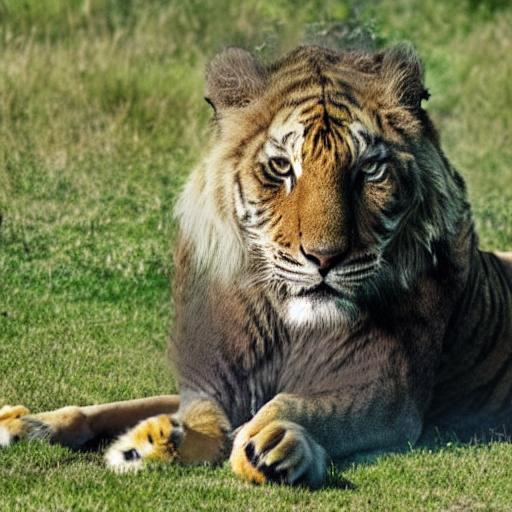

  0%|          | 0/51 [00:00<?, ?it/s]

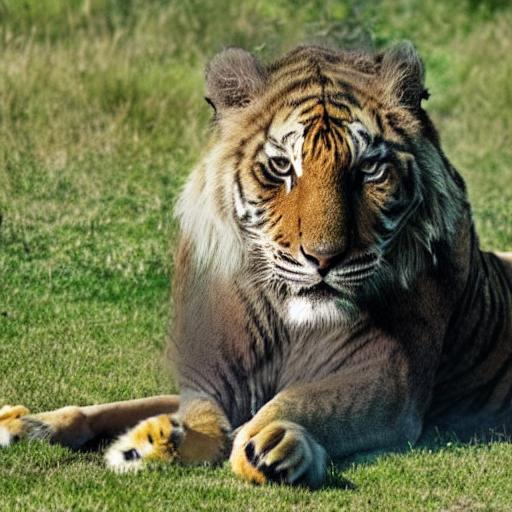

  0%|          | 0/51 [00:00<?, ?it/s]

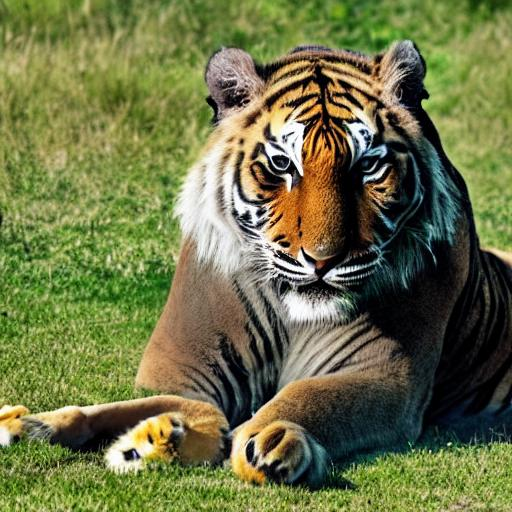

In [14]:
prompts = ["A picture of a lion lying in the grass",
           "A picture of a tiger lying in the grass"]

lb = LocalBlend(prompts, [("lion","tiger")])

controller_a = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4, local_blend=lb)
#_ = run_and_display(prompts, controller_a, latent=x_t, run_baseline=False, result_only=False)
prompts = ["A picture of a lion lying in the grass",
           "A picture of a tiger lying in the grass",
           "A picture of a tiger lying in the grass"]

for i in range(11):
  p = i/10
  controller = AttentionFullBlurPolate(p, prompts, NUM_DIFFUSION_STEPS, LQ=True, cross_replace_steps=0.9, self_replace_steps=0.8, controller=controller_a, local_blend=lb)
  _ = run_and_display(prompts, controller, latent=x_t, run_baseline=False, clip_alpha=p, result_only=True)

## Comparison to alternative: SEGA / "Stable Artist"

### First install dependencies & load SEGA pipeline

In [1]:
# On colab there is not enough vram to load both P2P and SEGA at the same time,
# so you'll have to restart the kernel to run this part of the code
# The first time an image is generated by P2P, the latent x_t is saved to the
# file "latent.pt". If this file does not exist, run that cell
# (the first cell under 'Our Experiments', which produces "a painting of a squirrel eating a burger", without any edits or interpolations)
# before restarting the kernel. This ensures the initial latent is the same between both models


!pip install git+https://github.com/ml-research/semantic-image-editing &> /dev/null
!pip install ftfy &> /dev/null

from semdiffusers import SemanticEditPipeline
import torch
from IPython.display import display


x_t = torch.load("latent.pt").to("cuda:0")


device='cuda'

pipe = SemanticEditPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",

    safety_checker=None,
).to(device)
gen = torch.Generator(device=device)

from PIL import Image
def image_grid(imgs, rows, cols, spacing = 20):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size

    grid = Image.new('RGBA', size=(cols * w + (cols-1)*spacing, rows * h + (rows-1)*spacing ), color=(255,255,255,0))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=( i // rows * (w+spacing), i % rows * (h+spacing)))
        #print(( i // rows * w, i % rows * h))
    return grid

Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


### Run some experiments

  0%|          | 0/51 [00:00<?, ?it/s]

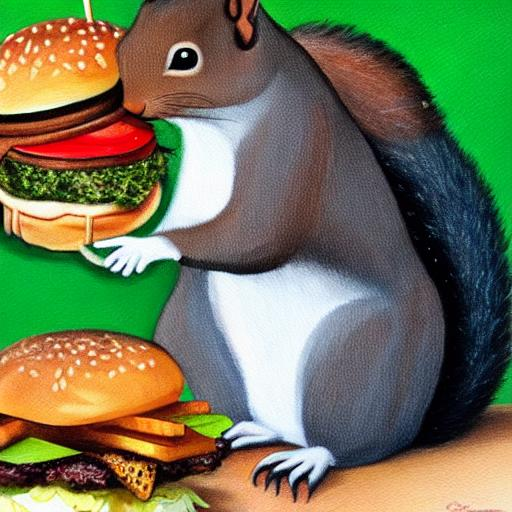

  0%|          | 0/51 [00:00<?, ?it/s]

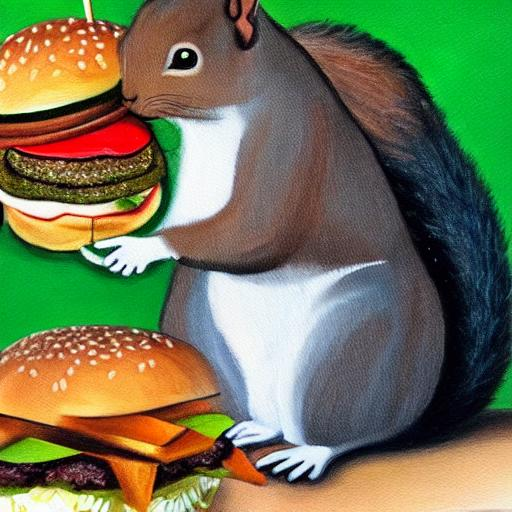

  0%|          | 0/51 [00:00<?, ?it/s]

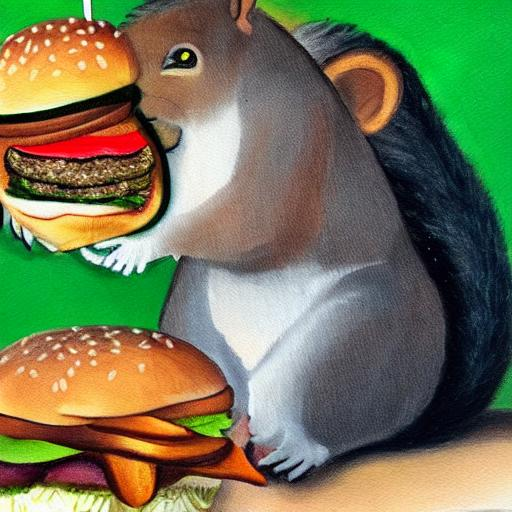

  0%|          | 0/51 [00:00<?, ?it/s]

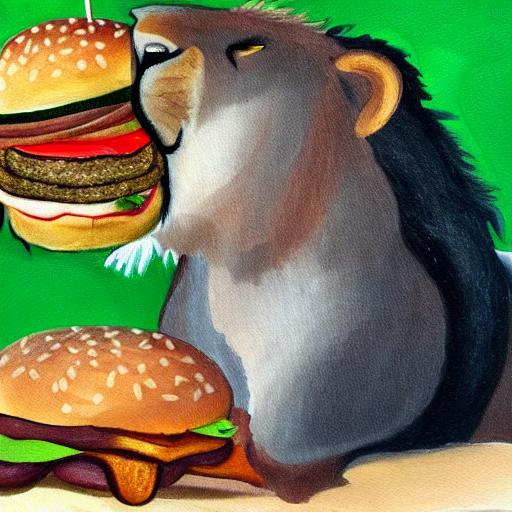

  0%|          | 0/51 [00:00<?, ?it/s]

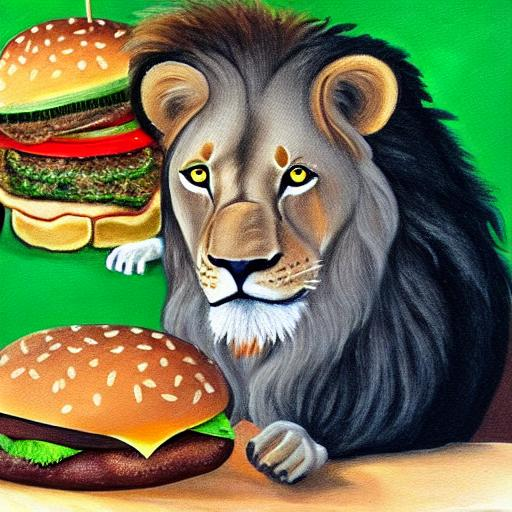

  0%|          | 0/51 [00:00<?, ?it/s]

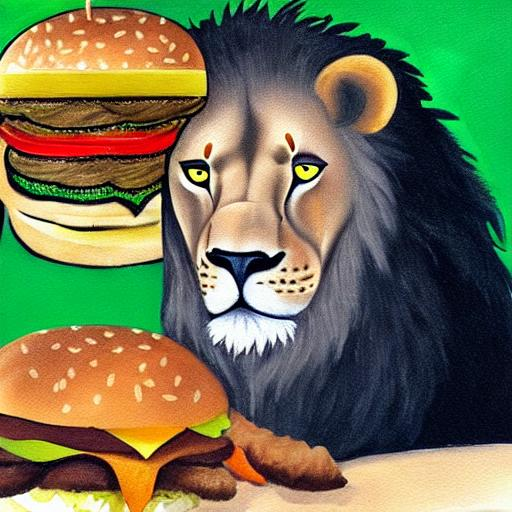

  0%|          | 0/51 [00:00<?, ?it/s]

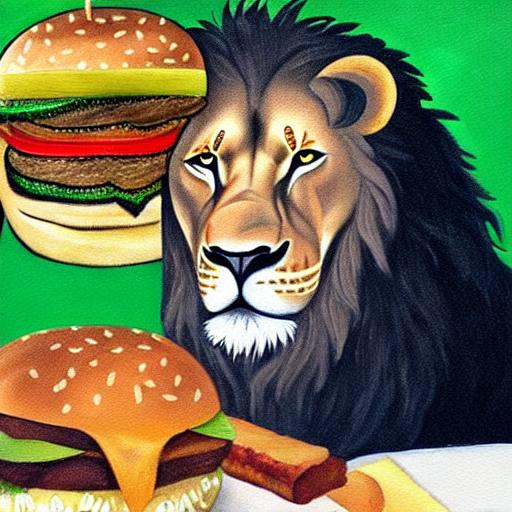

In [7]:
s = 7

for i in range(7):
  p = i/6*s
  target = {'editing_prompt': ['squirrel', 'lion'], 'reverse_editing_direction':[True, False],
            'edit_warmup_steps':8, 'edit_guidance_scale':p, 'edit_threshold':0.8, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

  seed = 8888
  prompt = 'A painting of a squirrel eating a burger'
  #gen.manual_seed(seed)
  #org = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5)

  torch.cuda.empty_cache()

  gen.manual_seed(seed)
  out = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5,
        **target)

  #display(image_grid((org.images[0], out.images[0]), rows=1, cols=2))
  display(out.images[0])

  0%|          | 0/51 [00:00<?, ?it/s]

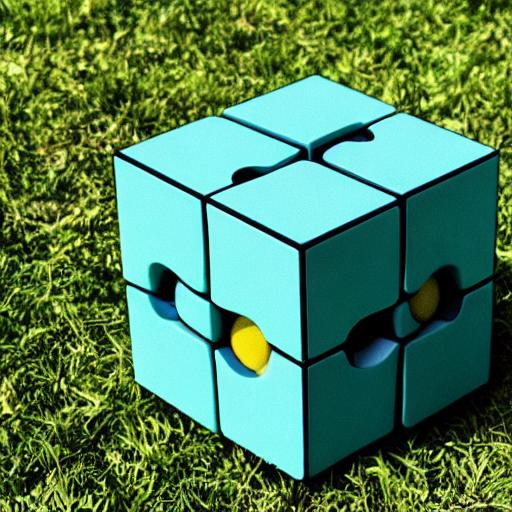

  0%|          | 0/51 [00:00<?, ?it/s]

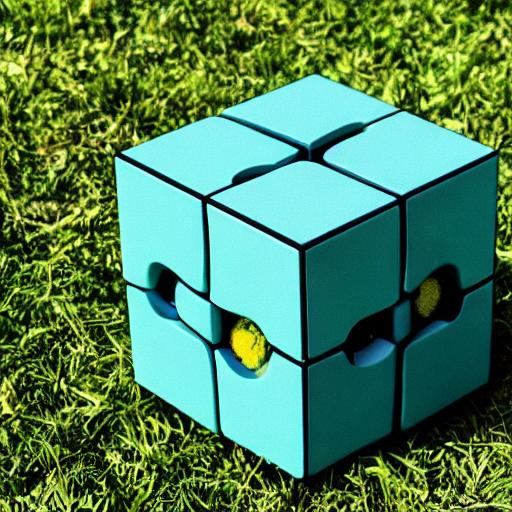

  0%|          | 0/51 [00:00<?, ?it/s]

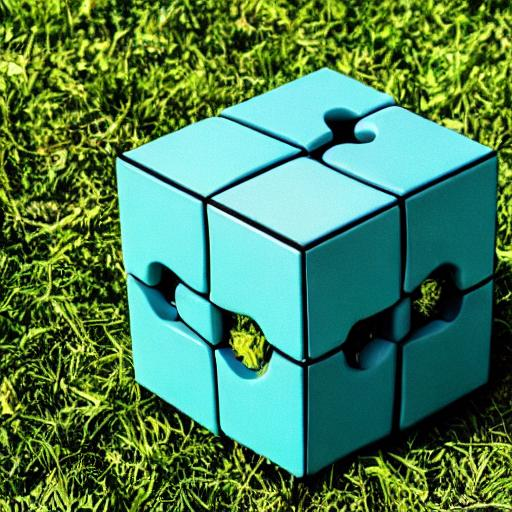

  0%|          | 0/51 [00:00<?, ?it/s]

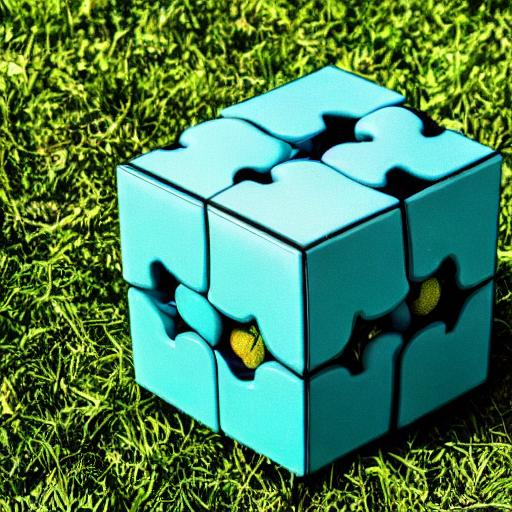

  0%|          | 0/51 [00:00<?, ?it/s]

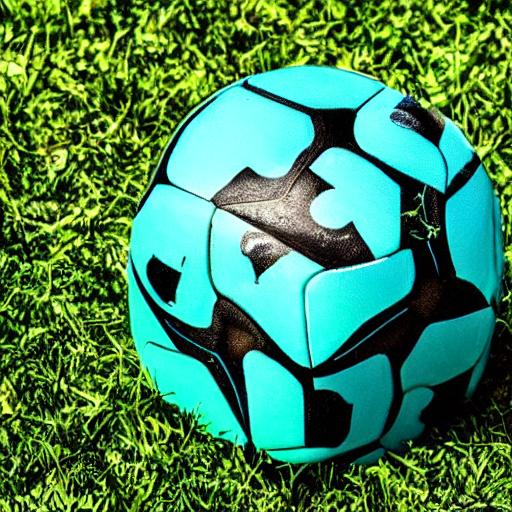

  0%|          | 0/51 [00:00<?, ?it/s]

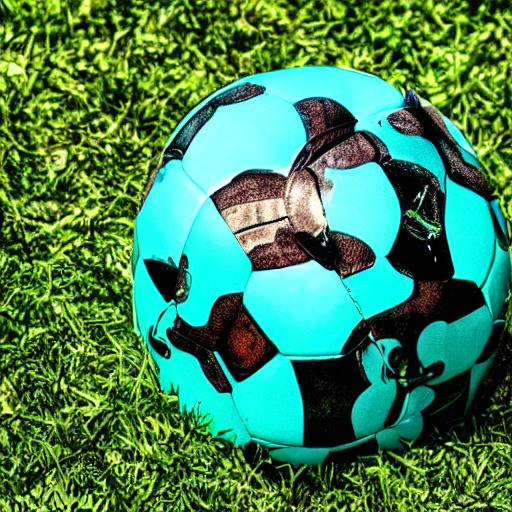

  0%|          | 0/51 [00:00<?, ?it/s]

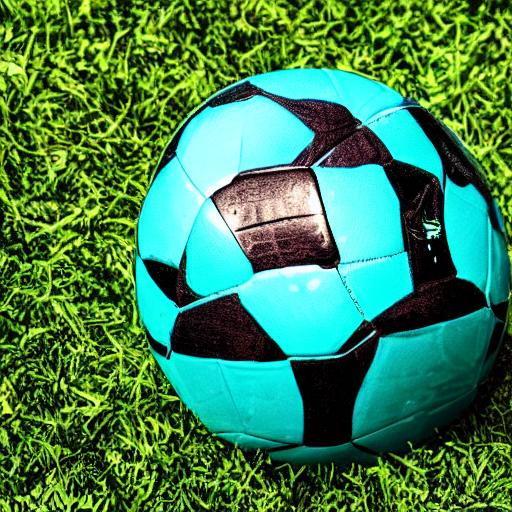

In [8]:
s = 4

for i in range(7):
  p = i/6*s
  target = {'editing_prompt': ['puzzle cube', 'soccer ball'], 'reverse_editing_direction':[True, False],
            'edit_warmup_steps':8, 'edit_guidance_scale':p, 'edit_threshold':0.8, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

  seed = 8888
  prompt = 'A puzzle cube in the grass'
  #gen.manual_seed(seed)
  #org = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5)

  torch.cuda.empty_cache()

  gen.manual_seed(seed)
  out = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5,
        **target)

  #display(image_grid((org.images[0], out.images[0]), rows=1, cols=2))
  display(out.images[0])

  0%|          | 0/51 [00:00<?, ?it/s]

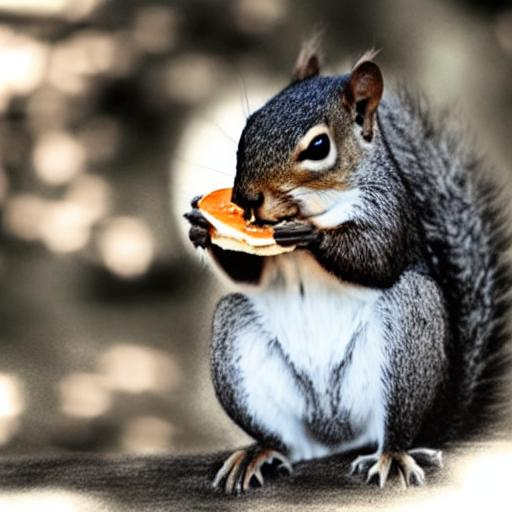

  0%|          | 0/51 [00:00<?, ?it/s]

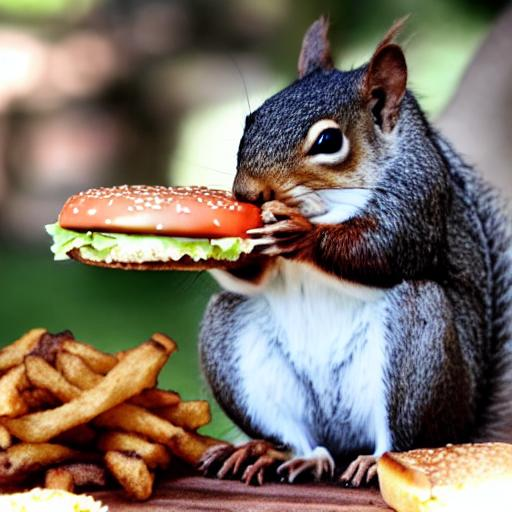

  0%|          | 0/51 [00:00<?, ?it/s]

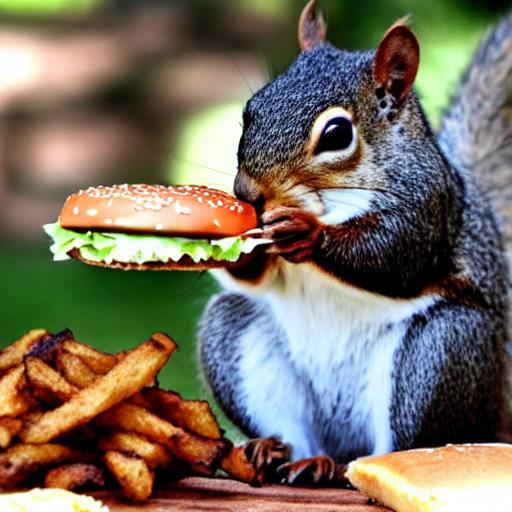

  0%|          | 0/51 [00:00<?, ?it/s]

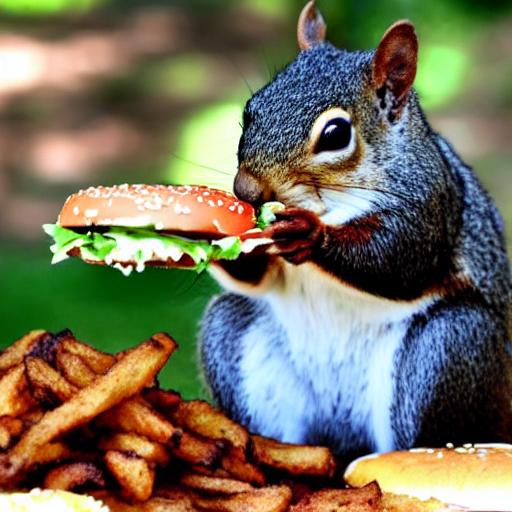

  0%|          | 0/51 [00:00<?, ?it/s]

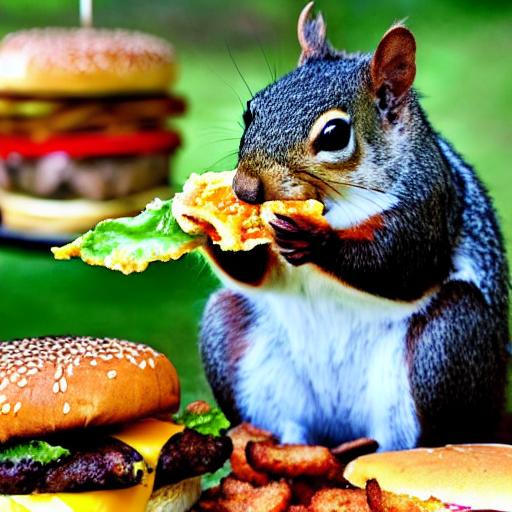

  0%|          | 0/51 [00:00<?, ?it/s]

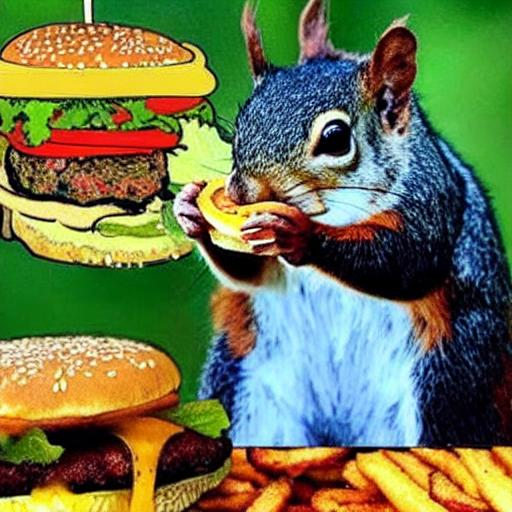

  0%|          | 0/51 [00:00<?, ?it/s]

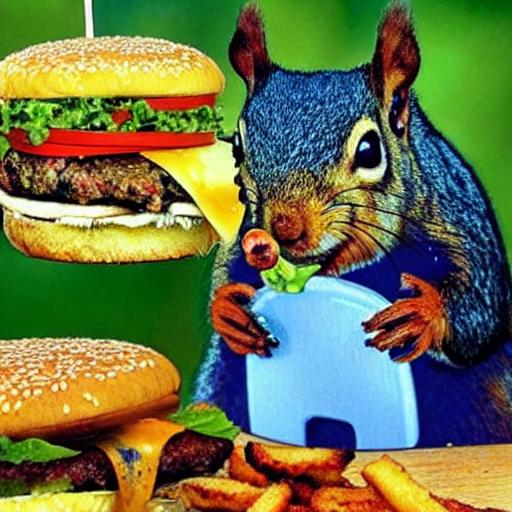

In [9]:
s = 5

for i in [-15/3, -10/3, -5/3, 0, 5/3, 10/3, 15/3]:
  p = i/5*s
  target = {'editing_prompt': ['charcoal drawing', 'painting by Van Gogh'], 'reverse_editing_direction':[True, False],
            'edit_warmup_steps':4, 'edit_guidance_scale':p, 'edit_threshold':0.8, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

  seed = 8888
  prompt = 'A squirrel eating a burger'
  #gen.manual_seed(seed)
  #org = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5)

  torch.cuda.empty_cache()

  gen.manual_seed(seed)
  out = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5,
        **target)

  #display(image_grid((org.images[0], out.images[0]), rows=1, cols=2))
  display(out.images[0])

  0%|          | 0/51 [00:00<?, ?it/s]

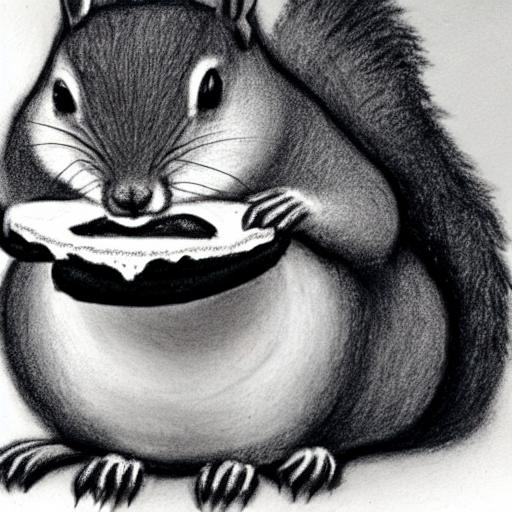

  0%|          | 0/51 [00:00<?, ?it/s]

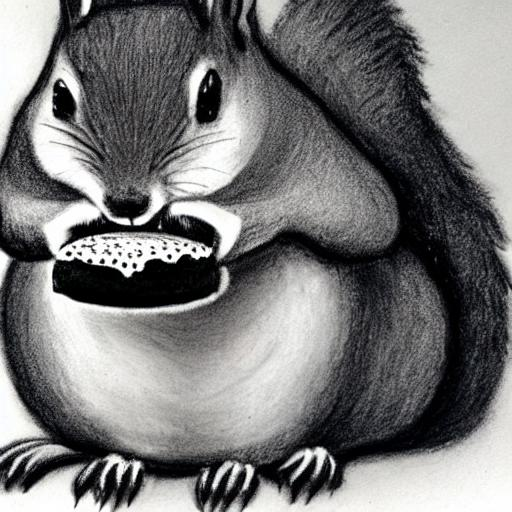

  0%|          | 0/51 [00:00<?, ?it/s]

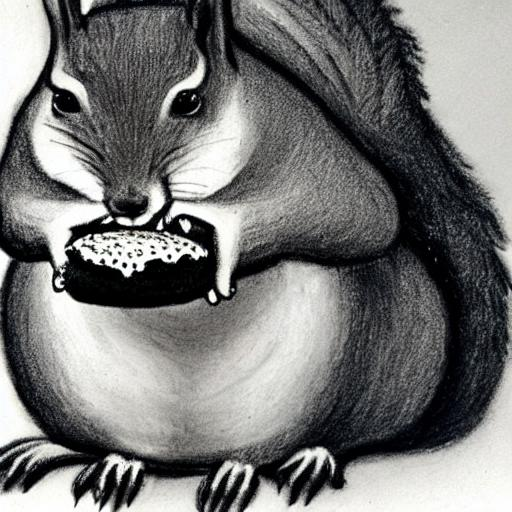

  0%|          | 0/51 [00:00<?, ?it/s]

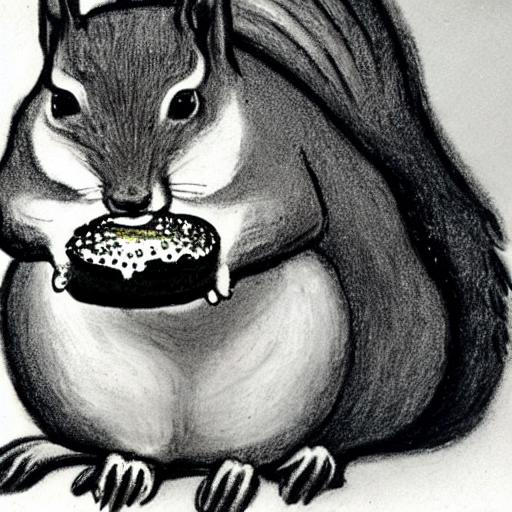

  0%|          | 0/51 [00:00<?, ?it/s]

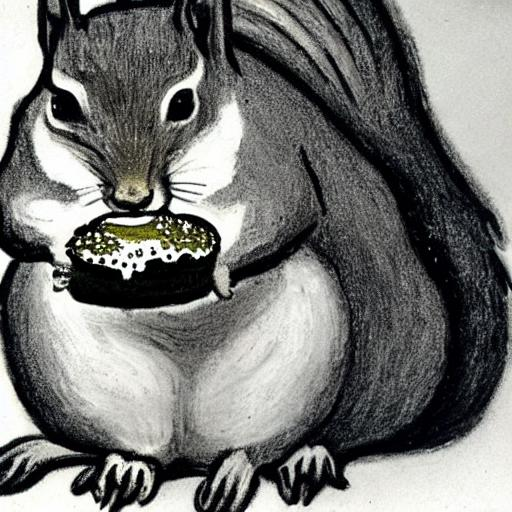

  0%|          | 0/51 [00:00<?, ?it/s]

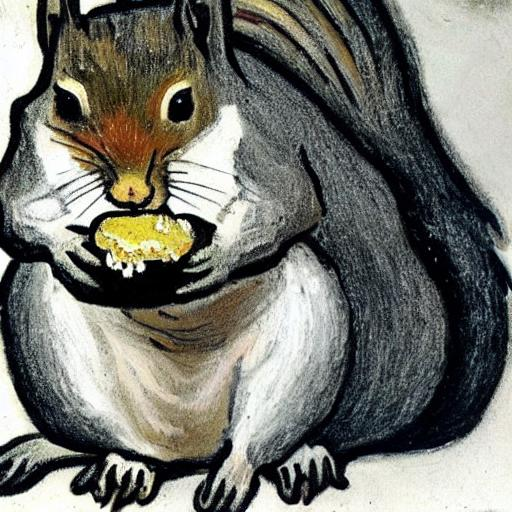

  0%|          | 0/51 [00:00<?, ?it/s]

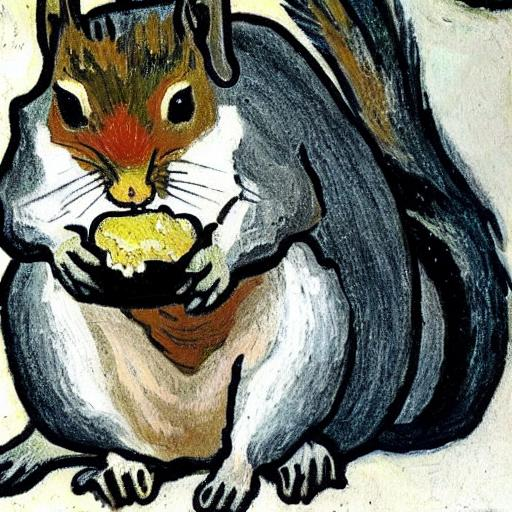

In [10]:
s = 6

for i in range(7):
  p = i/6*s
  target = {'editing_prompt': ['A charcoal drawing of a squirrel eating a burger', 'A painting by Van Gogh of a squirrel eating a burger'], 'reverse_editing_direction':[True, False],
            'edit_warmup_steps':8, 'edit_guidance_scale':p, 'edit_threshold':0.8, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

  seed = 8888
  prompt = 'A charcoal drawing of a squirrel eating a burger'
  #gen.manual_seed(seed)
  #org = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5)


  gen.manual_seed(seed)
  out = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5,
        **target)

  #display(image_grid((org.images[0], out.images[0]), rows=1, cols=2))
  display(out.images[0])

  0%|          | 0/51 [00:00<?, ?it/s]

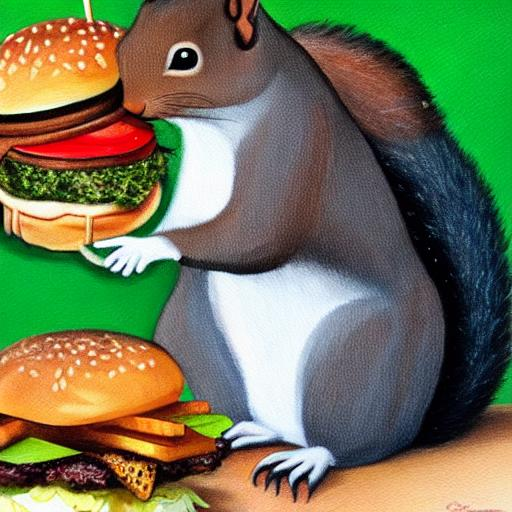

  0%|          | 0/51 [00:00<?, ?it/s]

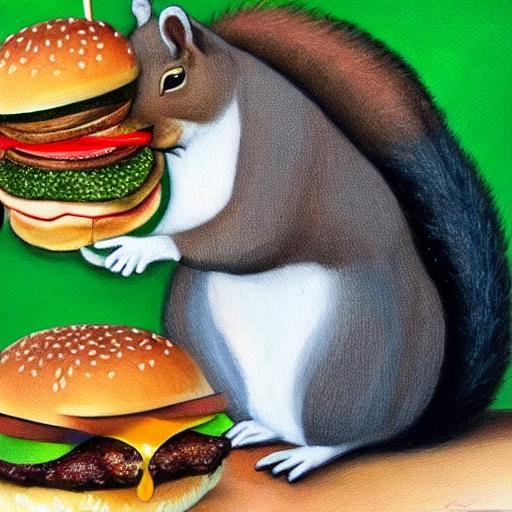

  0%|          | 0/51 [00:00<?, ?it/s]

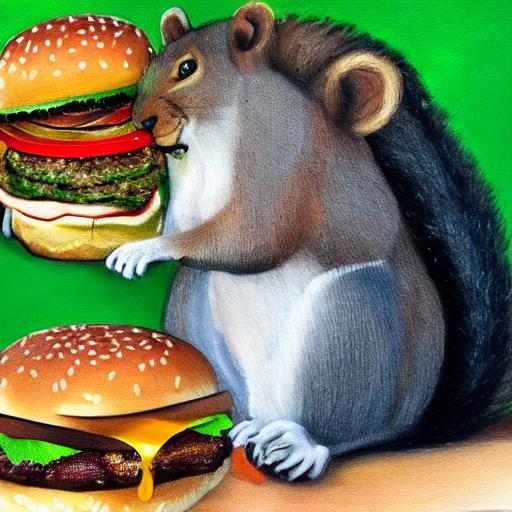

  0%|          | 0/51 [00:00<?, ?it/s]

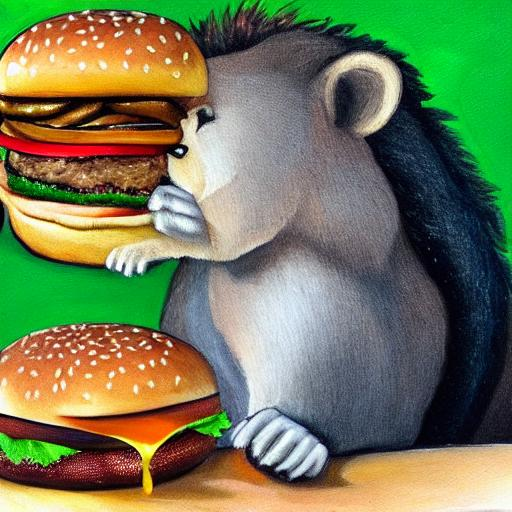

  0%|          | 0/51 [00:00<?, ?it/s]

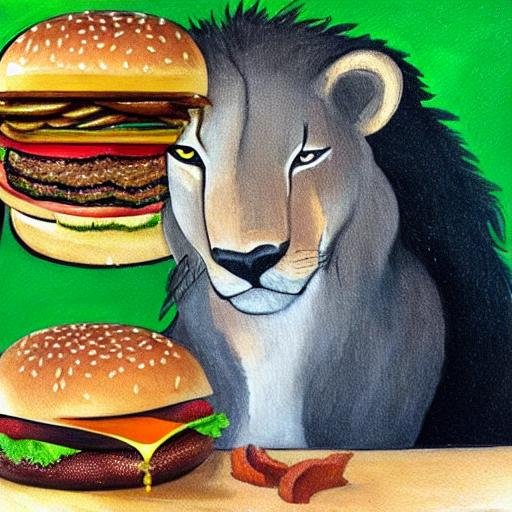

  0%|          | 0/51 [00:00<?, ?it/s]

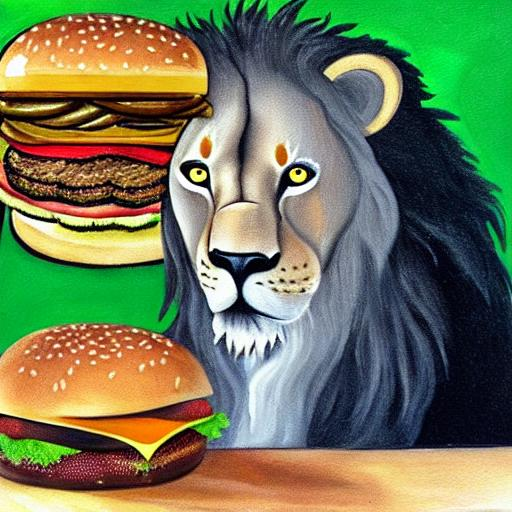

  0%|          | 0/51 [00:00<?, ?it/s]

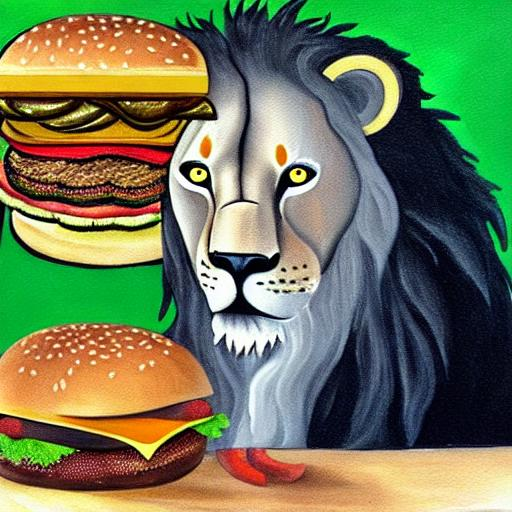

In [11]:
s = 7

for i in range(7):
  p = i/6*s
  target = {'editing_prompt': ['A painting of a squirrel eating a burger', 'A painting of a lion eating a burger'], 'reverse_editing_direction':[True, False],
            'edit_warmup_steps':8, 'edit_guidance_scale':p, 'edit_threshold':0.8, 'edit_momentum_scale':0.5, 'edit_mom_beta': 0.6}

  seed = 8888
  prompt = 'A painting of a squirrel eating a burger'
  #gen.manual_seed(seed)
  #org = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5)

  torch.cuda.empty_cache()

  gen.manual_seed(seed)
  out = pipe(prompt=prompt, latents=x_t, generator=gen, num_images_per_prompt=1, guidance_scale=7.5,
        **target)

  #display(image_grid((org.images[0], out.images[0]), rows=1, cols=2))
  display(out.images[0])